In [1]:
# Import packages
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.linear_model import Lasso
import matplotlib.pyplot as plt
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import LSTM, Dense, Input, Concatenate, Attention, Flatten, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from itertools import product
import tensorflow as tf

### Load Historical Dataset

In [2]:
df = pd.read_csv('historical_ywse_cleaned.csv')

### Feature Selection

In [3]:
# Drop non-numeric columns
df_non_categorical = df.drop(['year', 'state', 'crop', 'season'], axis=1)

X = df_non_categorical.drop('yield', axis=1) # features
y = df_non_categorical['yield'] # target variable

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
lasso = Lasso(alpha=0.1)
lasso.fit(X_train, y_train)
selected_features = X.columns[lasso.coef_ != 0]
print("Selected features: ", selected_features)

Selected features:  Index(['Inflation annual %', 'Population', 'temperature_2m_min',
       'temperature_2m_max', 'precipitation_sum', 'Mean_N_SOIL', 'Mean_P_SOIL',
       'Mean_K_SOIL', 'Mean_TEMPERATURE', 'Mean_HUMIDITY'],
      dtype='object')


In [4]:
hist_df = df[['year', 'season', 'state', 'crop', 'yield', 'Inflation annual %', 'Population', 'temperature_2m_min',
       'temperature_2m_max', 'precipitation_sum', 'Mean_N_SOIL', 'Mean_P_SOIL',
       'Mean_K_SOIL', 'Mean_TEMPERATURE', 'Mean_HUMIDITY']]

### Load Forecast Dataset

In [5]:
future_df = pd.read_csv('future_ywse_cleaned.csv')
future_df = future_df[['year', 'season', 'state', 'crop', 'Inflation annual %', 'Population', 'temperature_2m_min',
       'temperature_2m_max', 'precipitation_sum', 'Mean_N_SOIL', 'Mean_P_SOIL',
       'Mean_K_SOIL', 'Mean_TEMPERATURE', 'Mean_HUMIDITY']]

### Running Ensemble on State Level

/var/folders/nx/_bvgjl1d7hg01rqvr_jylx_h0000gn/T/ipykernel_9463/566133661.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_ensemble['Year_Season'] = df_ensemble.apply(lambda row: str(row['year']) + ' ' + map_season(row['season']) +' ' + row['season'], axis=1)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertibl

Epoch 1/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3926  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4238
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5924
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3886 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4909
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4372
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3611
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3869
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4753 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3911 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.6432  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4687 
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5892 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5936
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6502
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5476 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.6322
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3825 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5454
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4880
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.5488  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.5203 
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4133 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4754 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4553 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4451
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5030 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3417
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3004 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3984 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.5181  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4218
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4996 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4346
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4488
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5680 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5510
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4085
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3663 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3556
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Epoch 1/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.8553  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7160
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7924
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8388
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/ste

/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary

Epoch 1/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.3429  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3839 
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3631 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3542 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2669 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3425 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3722 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3490 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2434
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2784
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.5874  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4926
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4181 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3480
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2930 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3649 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3753
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3765
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3638
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4173
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.7163  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5133
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6169 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5996
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5248 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6813 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4955
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4324 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4444
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6062
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Epoch 1/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 65.1779  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 63.8074
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 62.3279
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 61.6612
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2m

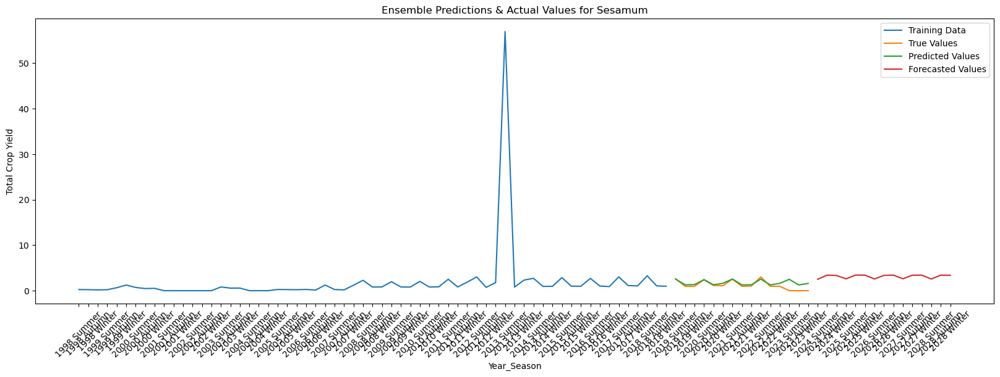

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.4283  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3934
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4271
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3688 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4711 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4064 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3917
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3524
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4424 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4505 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 7.3677   
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 6.6587
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 4.5198 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 7.0746  
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 6.2729 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 6.0201
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 5.4490
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 5.9393 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 3.8990
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 6.5042 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
Epoch 1/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.4941  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4201
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4754
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4980
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms

/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.7814  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.8558
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.2001
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.8103
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.3078
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.4394 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.1458
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.9745
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.7257
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.5947
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Root Mean Squared Error (RMSE) for Dry Chillies: 4.383466355492999


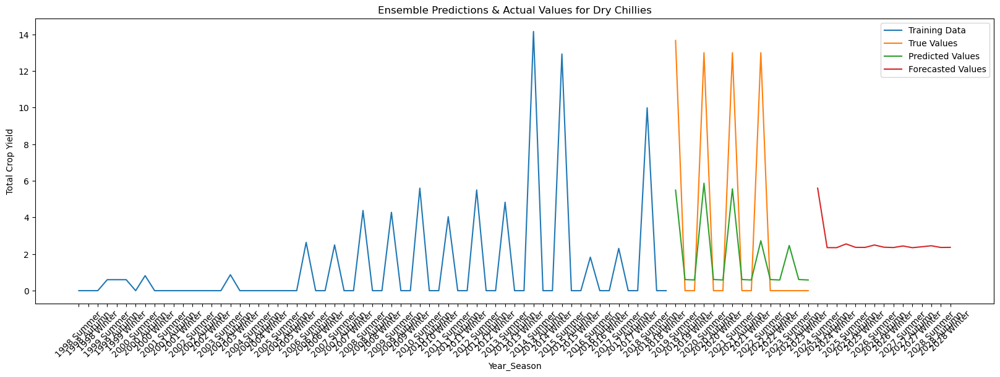

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.5448  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5483
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6631
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6748
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7705
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6350 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5190
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6711
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4722
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5356
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Root Mean Squared Error (RMSE) for Cowpea: 0.06600923704605069


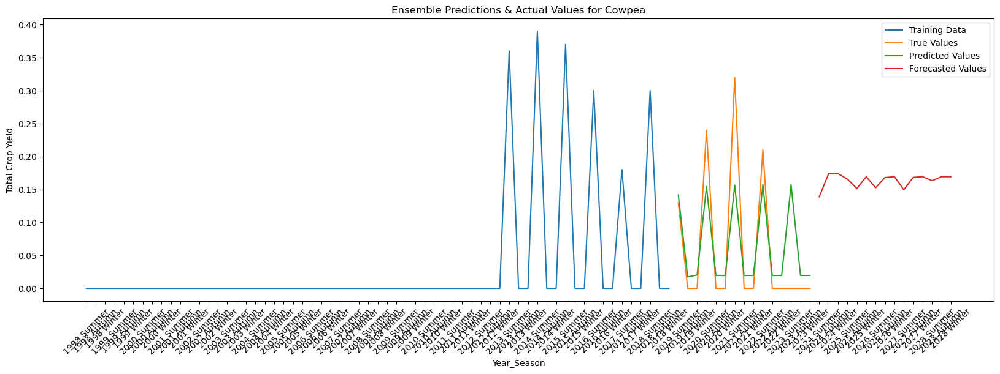

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.9152  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8293
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9703 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7795
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0012
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9360 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9490
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4436 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6823 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6054
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Epoch 1/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.5416  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4081 
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3681 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.5126 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms

/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.7758  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6483 
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.7675 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.5037 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7831 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6571 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6726
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.8311
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5759 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.8444 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
Root Mean Squared Error (RMSE) for Cotton: 0.40575767488594794


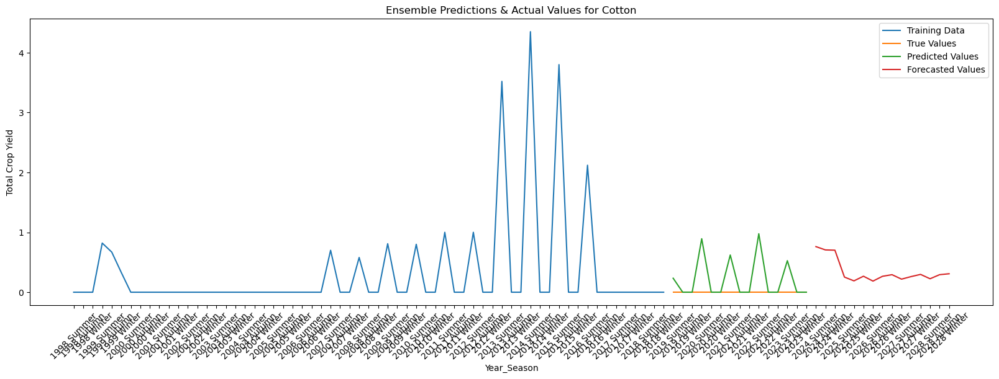

Epoch 1/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.4972  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5849
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6888
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6889
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5196 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6757
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3620
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3414 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5469
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4175
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
Epoch 1/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.4592  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3546
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3575
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3479
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 

/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.5372  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4115
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4663
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5347
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5588
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5462
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4449 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5141 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3152 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4244
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 199ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.6736  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7001
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7012
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8766 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7009
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2154
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5676
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5668
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5859 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6862
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible st

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.7471  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7410
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8457
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0171
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6234
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9666 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6655 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9640
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8643
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8395
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.4957  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4817
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4121 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4110
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5322 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3915 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4460 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4074 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3891
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4669 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.4865  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5143
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4954
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5326 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6919 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4446 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5574
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4370 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5670
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5907
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.6034  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8299 
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6235 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8041 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6186 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8513
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3799
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8727
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5888 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7671
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step
Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.3608  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3895
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3812
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3020 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3136 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3306
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3297 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3382 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3432 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2900
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
Root Mean Squared Error (RMSE) for Urad: 1.6056833871759815


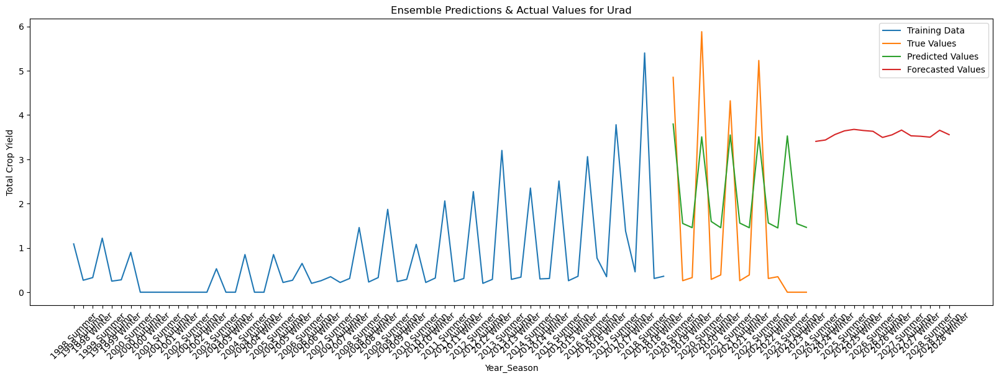

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/vanyabendatu/opt/

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.4290  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2787
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3747
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4948
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3346 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4701
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4291
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3158 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3281 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3318
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.5947  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7700
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7079
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6042 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5091
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5793
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7729 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6096 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5751 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7603
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
Epoch 1/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.1390  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1220
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.1736 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1942
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/s

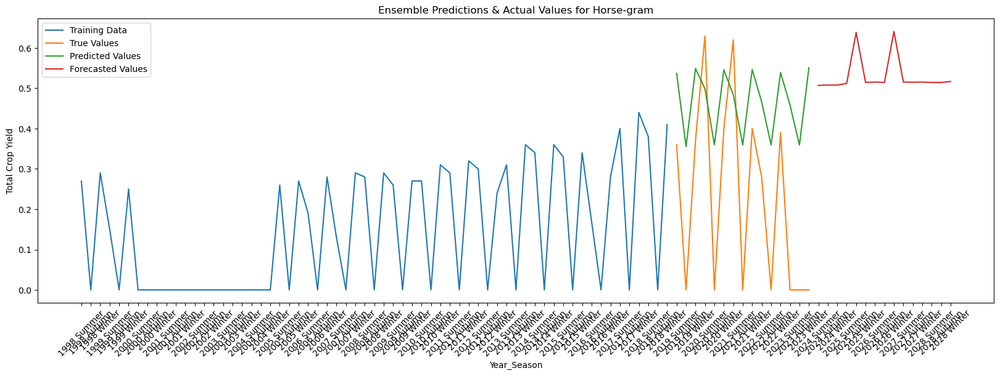

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.3419  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.5906 
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.4654
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2416
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1574
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0978
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.4203
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2609
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1903 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2449
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.1859  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.2087 
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1059 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0151 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2684 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0683 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.1604 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0871
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.4814 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.5034 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step
Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.2668  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9906 
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0819
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9490 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0011
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0148
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.0703 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0069 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7501 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8936
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Epoch 1/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.9324  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5888 
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6694
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7074 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms

/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible st

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.8238  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7458
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7201 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5771
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7184 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5514 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.5872
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5954
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6618 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5523
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.5607  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4474
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5700
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5720
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5593
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6268 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7421 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5186 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6326 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5272 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.3442  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.4087 
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2924
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.3753 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2008 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2215
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0676
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.4596 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1609 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.3435
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
Root Mean Squared Error (RMSE) for Groundnut: 3.310376385926298


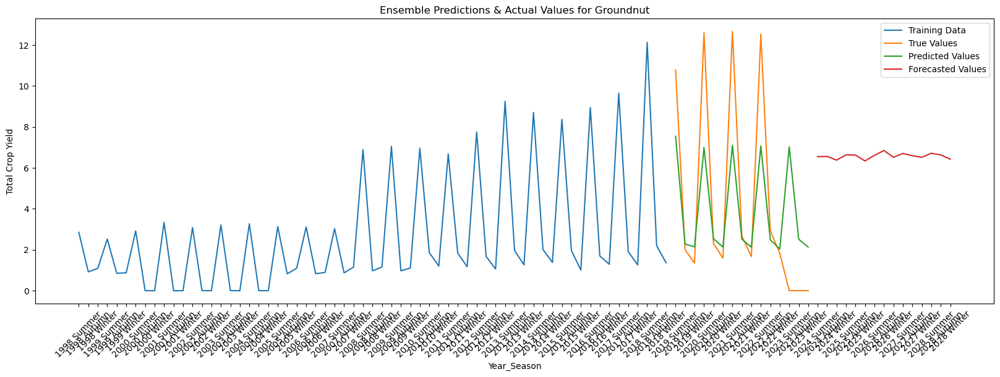

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.2415  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.4540 
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0843 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.5239 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1187 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.3235 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9356
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9274 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8669
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8479 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
Epoch 1/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.8237  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1155
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0211 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.5741
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2m

/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.2134  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.3028 
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.1896
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.4174 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.5004
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.5984
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.5794
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 3.2135
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.3630 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.0068
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Root Mean Squared Error (RMSE) for Bajra: 1.8347967542550272


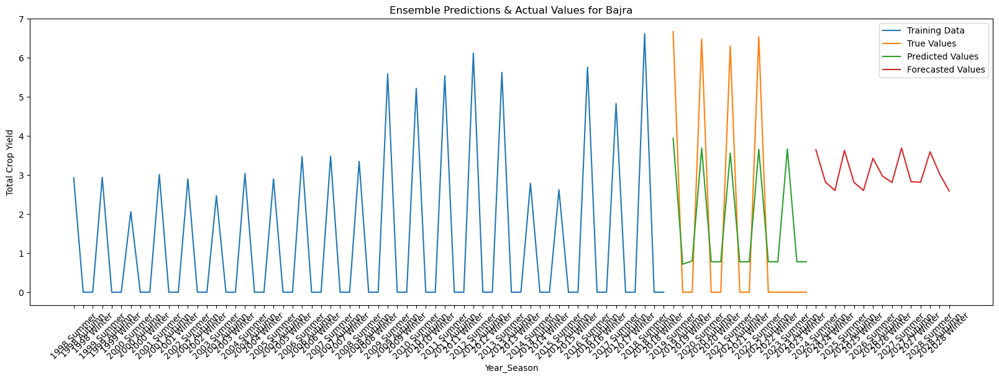

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.5625  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5298
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7019
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6476
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5851
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4986 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5477 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4499 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5092
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5288
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.4878  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3789
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4249 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4021 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3883 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3901 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3301
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4190 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3694 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3515
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.5295  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5071
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5977 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5346
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.5095 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5652
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.6723 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5748
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4668
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4394 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
Root Mean Squared Error (RMSE) for Rapeseed & Mustard: 0.3035855505138861


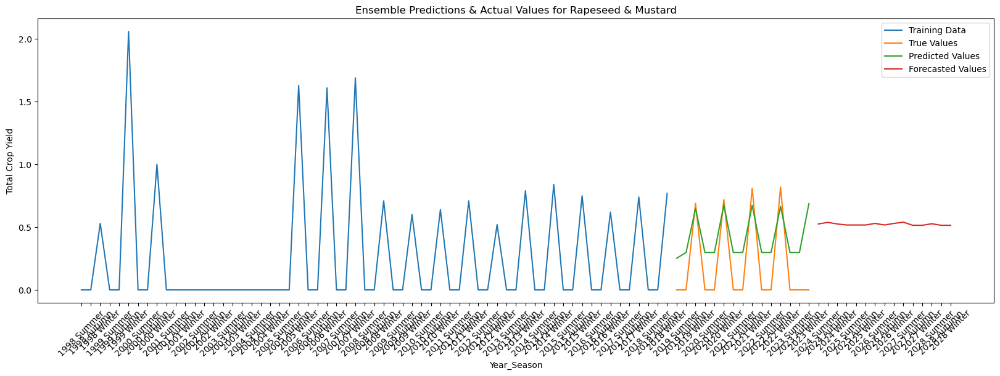

Epoch 1/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 67.9248  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 65.4716
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 66.0095
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 78.3333 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 55.9596
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 56.1864
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 79.8340  
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 68.6035
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 67.4423
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 68.5501 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 46.1199  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 33.9162
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 41.3011
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 37.5753
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 37.0786
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 46.8903
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 42.9122
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 34.8946 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 39.8140
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 43.6625 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Epoch 1/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1066.4045  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1160.4774
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1068.6971
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1094.6481 
Epoch 5/10
2/2 ━━━━━━━━━

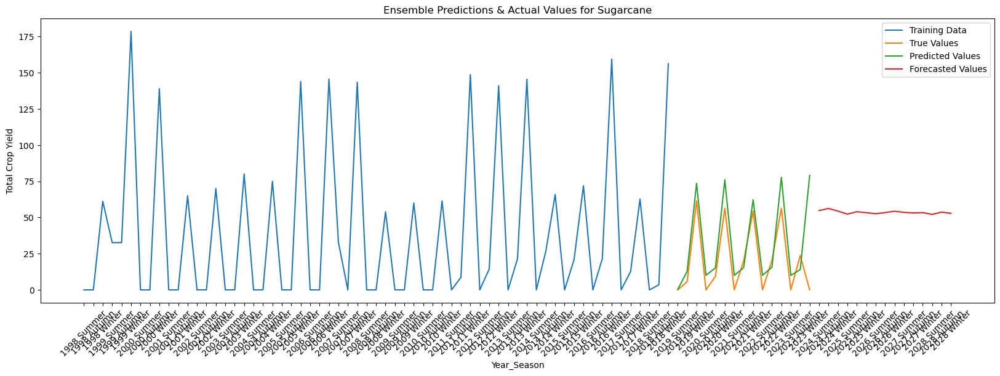

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 11.5934  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 15.7708 
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 12.3963 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 13.4363
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 13.6793
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 12.8590 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 13.6702 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 13.4626
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 14.8675 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 10.0861
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Epoch 1/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.4000  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5092
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4153 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4044
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━

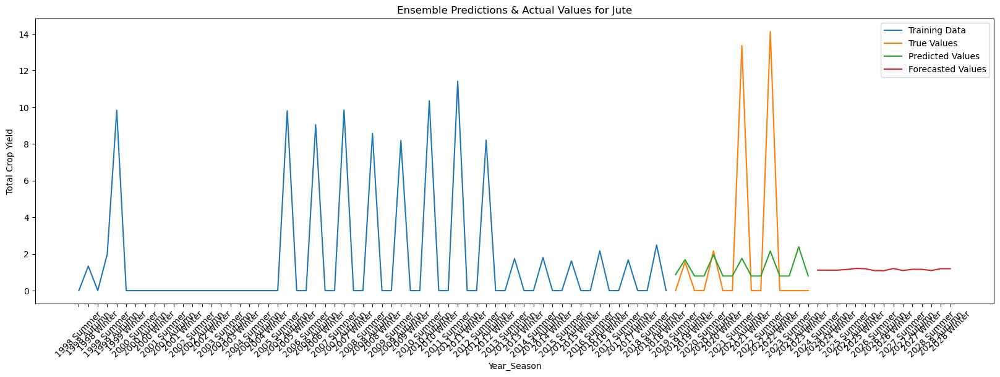

Epoch 1/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.6295  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6641 
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4827 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6053
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5649 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6533
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5963
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4673 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5998
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4656
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Root Mean Squared Error (RMSE) for Ginger: 0.011758813810846347


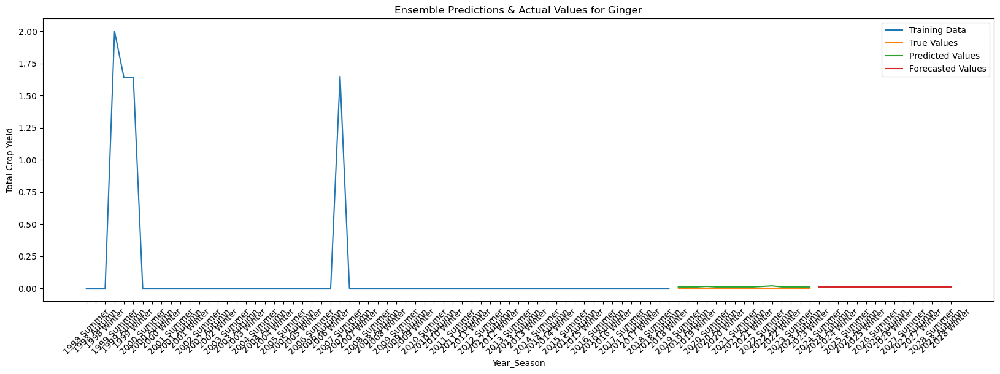

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.5939  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.6149
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6460
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5659
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6275
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5723
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5656 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4277
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4354
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.7426
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 253.6045  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 277.9921 
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 311.0243 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 262.7862
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 287.4452
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 275.8997
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 303.2760
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 329.0419
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 335.7763
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 278.0320
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Epoch 1/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 11.3559  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 11.3821
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 7.2638 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 11.9606 
Epoch 5/10
2/2 ━━━━━━━

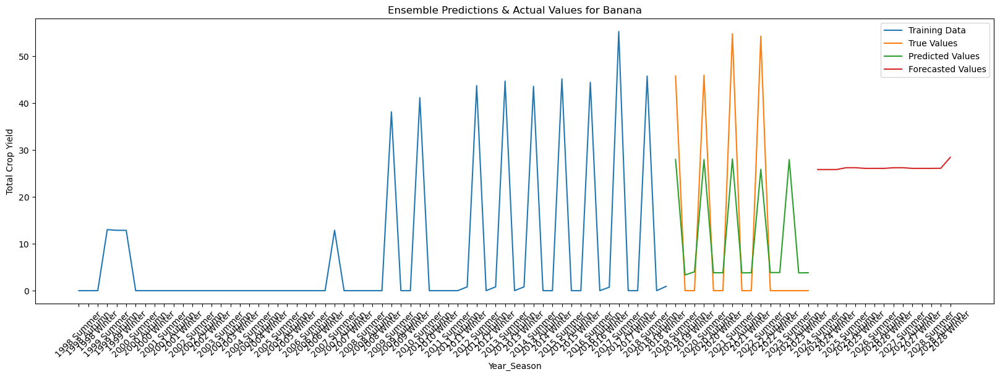

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.6976  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.5973
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4492
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4521 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4714
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4957 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6384 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3714
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4494
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3941
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.0019  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.3953
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.5797
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.4376
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.5294 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.3680 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1860
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2071 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.4699 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2412
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.9133  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7320
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.7402 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7580
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7303
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7530 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7374 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5261 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6513
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6851 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.6393  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9808 
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7510 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6570 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7449
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7812
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7921 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8008
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7089 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6732
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Epoch 1/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.3385  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3076
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3696
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3169
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/s

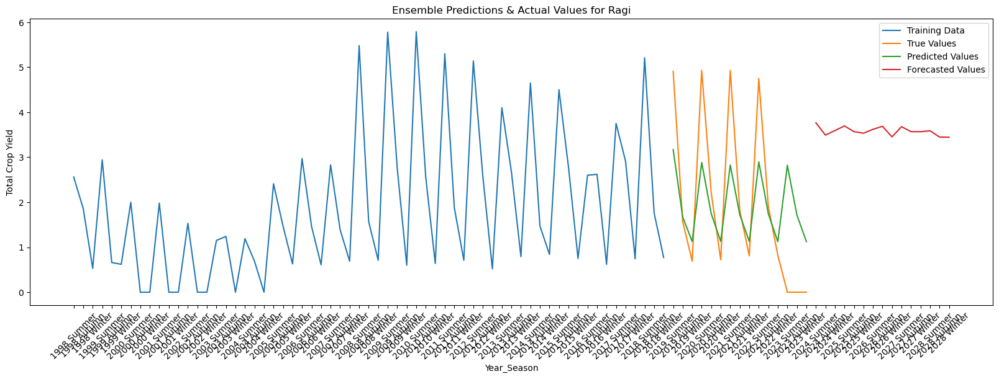

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 44.9189  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 35.3322
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 41.9049 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 46.2470
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 35.2906
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 36.4717 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 46.4784 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 45.1705 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 42.2569 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 47.9291
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 10.0717 
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 10.5467
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 10.9118
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 10.7891
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 10.1749
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 8.1847
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 11.5118
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 10.9282
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 11.0286
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 10.6234
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Epoch 1/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.6722  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.0071
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.0280
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.7161 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2

/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 11.7571 
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 13.6392 
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 12.8463 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 11.4344 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 13.4388 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 14.3150 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 13.9846 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 11.3705
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 10.8062 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 11.5298
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 6.8261   
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 3.5511
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 5.1532 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 5.9366
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 4.2194
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 5.5873
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 5.1461
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 3.8773
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 7.1245 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 6.6386
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Root Mean Squared Error (RMSE) for Potato: 11.620847964249322


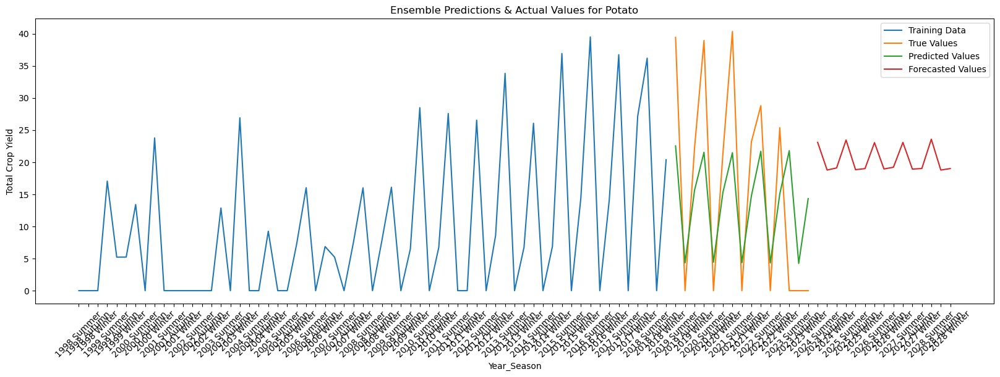

Epoch 1/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.7602  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4502 
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.5840 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3599 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3627 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.5242 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5391 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6055 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6381
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5336 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step
Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 3.8743  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 3.7217 
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 4.1654
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 3.8380 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.6285
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 4.9517
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 3.8839
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 4.2970
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 4.3434
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 3.6865
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step
Root Mean Squared Error (RMSE) for Peas & Beans: 0.28891989776458504


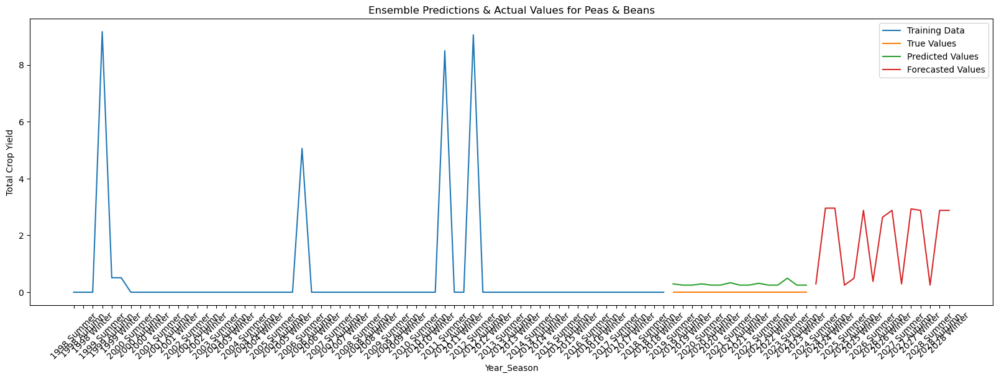

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.3134  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3121 
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3758 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2540 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3090
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2266 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3109
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3417 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.2447
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3161 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.6666  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2149
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7673 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1421
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0408
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1025
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7692
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8018
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8404
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9734
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Epoch 1/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 1.5761  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.8081 
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.7343
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.7998 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/ste

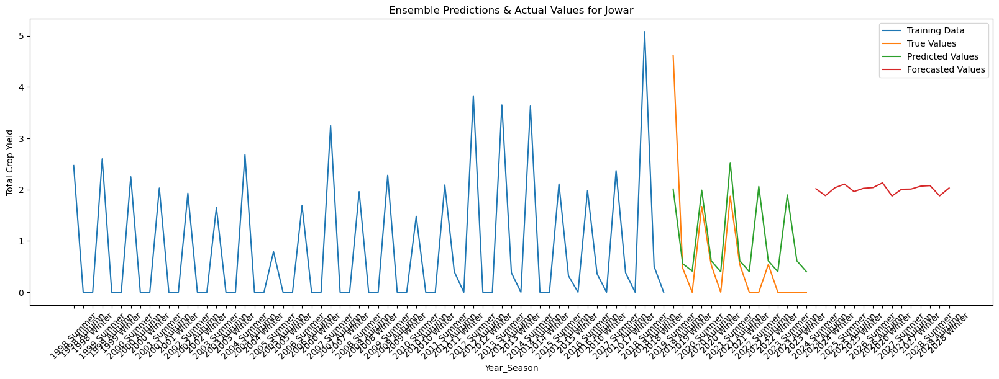

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/vanyabendatu/opt/

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.4664  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3009 
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3377 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3526
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2827
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2354 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4320
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2815 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2980 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2425 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.2774  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4024 
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3991
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2861
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4443
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4166
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3398 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3824
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2759 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3027
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.3403  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2981
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0501 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1656
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1413 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2363
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9385 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2815 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1751 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.3006
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.7334  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7314
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5952
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8383
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7683 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8884
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.7159 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4872 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7242 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7445
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.2526  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3650
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3762
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4510
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4154
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3960
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4485 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4169
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4305
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2896
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step
Root Mean Squared Error (RMSE) for Sunflower: 0.884270112507096


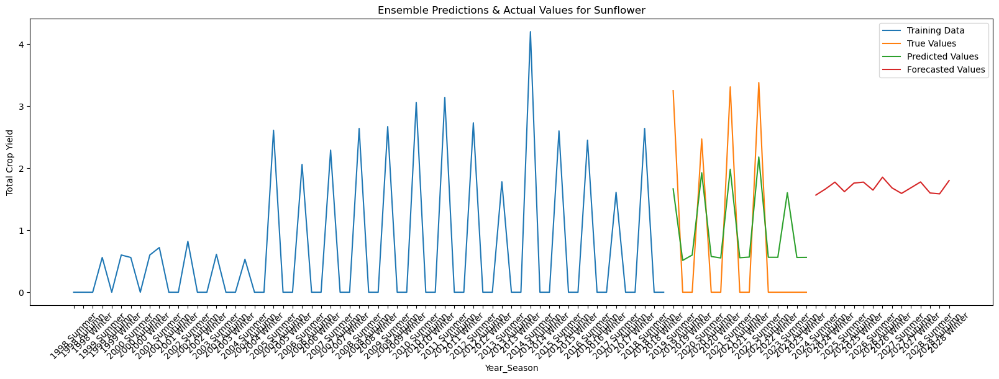

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.8987  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7473 
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6003 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.7620 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.9399
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0590
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5960
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7493
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8058 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6739
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step
Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible st

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.6299  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.5480 
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6750 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6114
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7697
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6425 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8445
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6892 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6951 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5755
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 3.5410  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.9159 
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 3.0839
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 3.2537 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 2.8099
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 3.2025
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.7312
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 3.5497 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.8251
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.7886
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
Epoch 1/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.8235  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2748 
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7312
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.8982 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/s

/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.4219  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9560 
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.2226 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8053 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8131 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.0918 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9377 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1710
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.3041 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.9971
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.5400  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4248
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5432
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4735 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3252 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4967 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4222 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3963 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3818
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3873
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 6.0396  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 5.1914
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 6.5431
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 5.1823
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.3419 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 4.9449
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 5.7177
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 5.1641
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 5.0752 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 5.4023
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.2298  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1779
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8903 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0578 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1811 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0227
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1150 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1428 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0033
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0120 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 3.4679  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 2.9651 
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.7647 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 3.3302 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 3.5757 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.7190
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.9402 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.6201 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 3.2204 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.4297 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Epoch 1/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.7196  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8540
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8244 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7505
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2

/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.8101  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6532
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7146
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.5918 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4916
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4964
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5283 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5881
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4092 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5054 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization f

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 9444.2393
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 9441.2256
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 18293.8535
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 9449.6211
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 9463.0479
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 9478.7266
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 18329.3496
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 18333.0684 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 9438.1357
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 18300.3262 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 5.0841  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 5.2496
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 5.3958 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 4.9833 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 5.0298 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 5.4862
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 4.5809
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 5.4501
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 4.2911
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 4.5719
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Root Mean Squared Error (RMSE) for Maize: 8.117751216149124


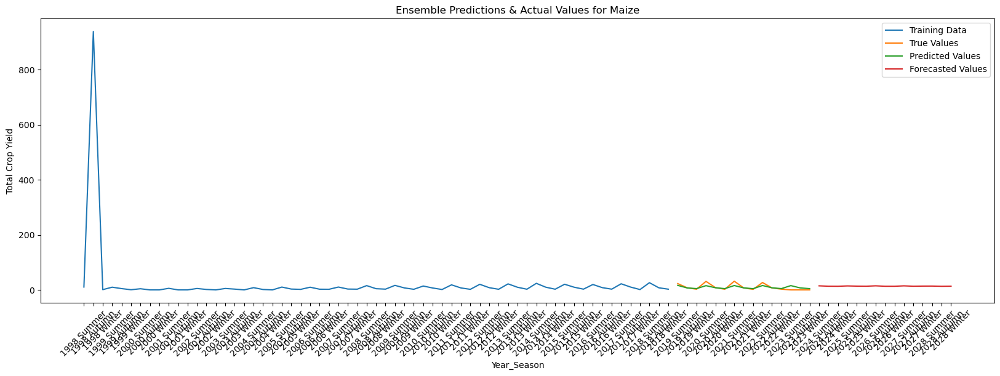

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.4572  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3265
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3370
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3339 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4684
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3860 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3533
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3161 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2989 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3036
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


Epoch 1/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 7.3005  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 7.0866
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 7.1029
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 7.0122
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 6.7592
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 6.6404 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 6.6486
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 6.3556
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 6.5085
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 6.2066
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Epoch 1/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 3.5390  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 3.0248
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 3.9073 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 3.9630 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━

/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.2352  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.9156 
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.6619
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2083 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.6510 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.5906
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.7692 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.7201 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.4897
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.3071
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step
Epoch 1/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.0629  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.9016 
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.1816
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2692
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/

/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.6020  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.5641
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.3806 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.9736
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.1085
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.0532 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.2260 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.2534 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.1317
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.6621
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 3.3292  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.8144
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 3.1981
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 3.3575
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 3.3357 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 3.3436
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.8082
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 3.3581
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.2987 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.9543 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Epoch 1/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.5592  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4414
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.5016
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4208
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/ste

/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optim

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.2833  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3629
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3149 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3143 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2292 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2729 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2361
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3227 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3213
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2371 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Epoch 1/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 6.6455  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 6.8771
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 6.7168 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 6.8695 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2m

/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 13.9711  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 12.3758 
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 11.6321
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 11.0664
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 12.6720 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 13.3884 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 13.0856
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 13.3471 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 12.3517 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 12.4416 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Epoch 1/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 3.6579  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 3.1027
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.8513
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 3.6243 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━

/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.9499  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.9611
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.8355
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.7698 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.6934 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 2.7152 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.6952
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.6551
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.5748
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.4924
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step
Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 3.3755  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 3.4121 
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 3.1275
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 3.2295
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 3.0930
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 3.0378 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.9443
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.8969 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.6848
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.6954
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.9246  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8885
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1782 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1303 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.1898
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9583 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0370
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8563 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.3544
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9147 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 3.1540  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.8920
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 3.0820
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.7394 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 3.3691 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.2825
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.4053 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.9914 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 3.2287 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.5792 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
Root Mean Squared Error (RMSE) for Rice: 11.283341441187037


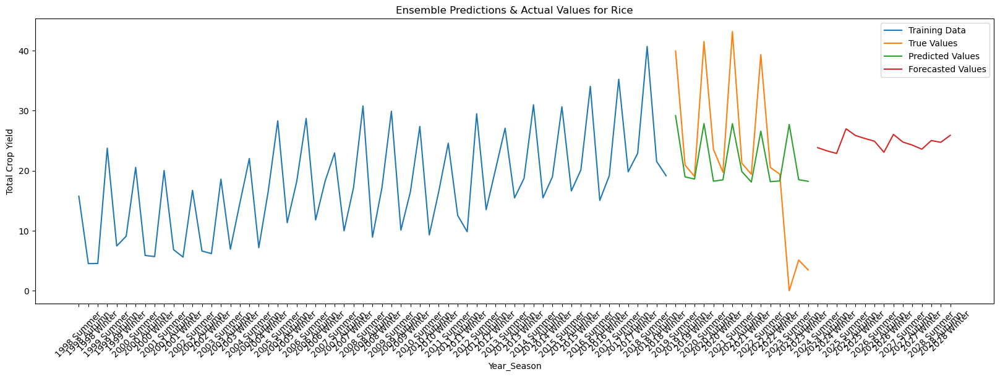

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.9162  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.5790 
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.8524
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.6047 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.8991 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 3.1643 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.6562
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 3.0641 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.4963 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.9432 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
Epoch 1/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 28.6098  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 33.6120
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 33.9054
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 29.7355
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s

/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 17.6798  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 13.1412 
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 12.2733
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 12.8526
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 17.8226 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 14.0292 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 14.4349
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 13.0798 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 13.2909 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 15.5698 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Epoch 1/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.0784  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1300 
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2299 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7418
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━

/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 87.4171  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 72.5235
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 89.8111
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 97.7344 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 90.7178
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 89.5281
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 84.9873
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 80.1998 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 99.5373 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 75.4325 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.3419  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.2321
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 3.8751
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 4.1446
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 3.8835 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.4757 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 3.6063 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 3.7462 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.1694 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.1180 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Root Mean Squared Error (RMSE) for Onion: 15.75330241941706


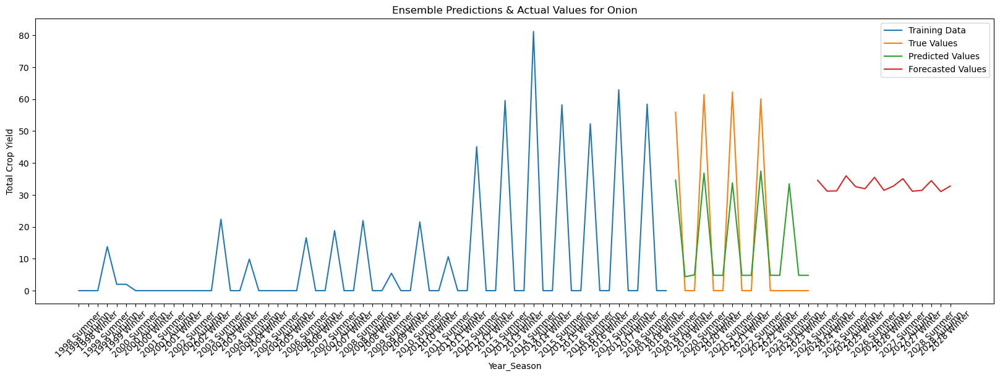

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.4742  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3368 
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4558
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4390 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2748
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3803 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2792
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3844 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3121 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3422 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Epoch 1/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.8582  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.8024 
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6607 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8359 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2

/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.5611  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3760
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5046
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4643
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5251 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3598 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4671 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4255
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4793
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3559 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step
Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization f

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4925  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3089 
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3659 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3848
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4535 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3089 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.2556 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4833 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3955 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3350 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.2279  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2316
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2793
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1769 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2233 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.2399
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2198
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1830
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2324 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1468 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible st

Epoch 1/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.4332  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3011
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3508 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5005 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2852 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3705
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3126
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3716
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4101 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4410 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.4834  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4443
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5463 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4318 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4651
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4600 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5018
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5258
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3842
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3542
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/vanyabendatu/opt/

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.6199  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2808 
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4707
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4323 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3197 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4047
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5066 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2767 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3257
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3118 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step
Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.9278  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9109
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7811
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9488 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8576
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7409
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6737
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7314
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7440
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8193
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.6891  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5958
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9157
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5344 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5865
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7461
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6382
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6495
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6916
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4493 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
Epoch 1/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.4292  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5329
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.5305 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5699 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/st

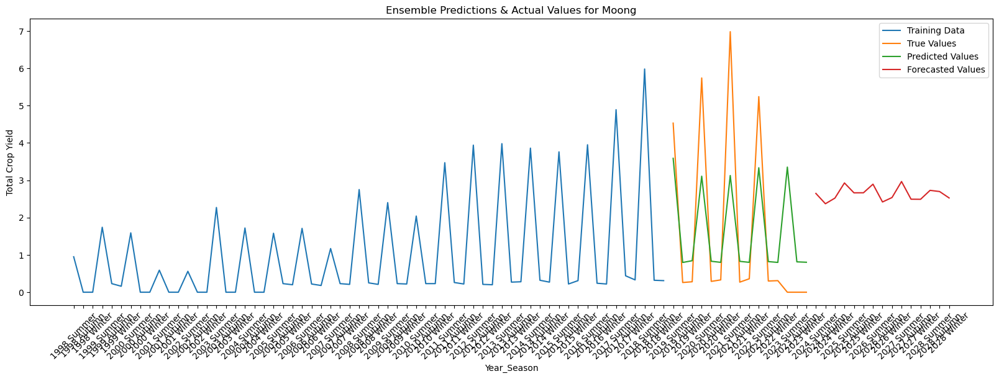

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.3816  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3359 
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4230 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.6710 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2825 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3685 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4843
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3564 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3574 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3078 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.9171  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8182
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4977 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9677
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.5845
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6439
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6393 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5060
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6866
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4766 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Root Mean Squared Error (RMSE) for Niger seed: 0.09118995296912139


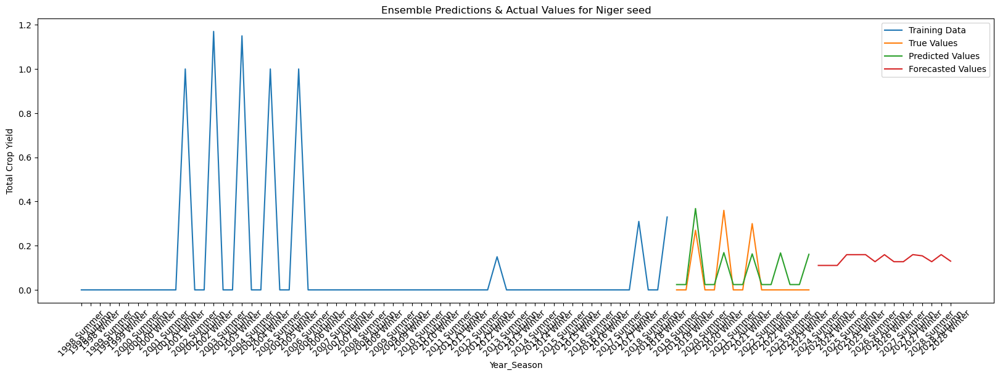

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.5528  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.5028 
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5915
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4585 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7186 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.5246 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.7298 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7782 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6902
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4864
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible st

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.6884  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3903 
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.5643 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5688
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5055 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4744 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4314 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3355 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4018 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5211
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
Root Mean Squared Error (RMSE) for Other Summer Pulses: 0.5138103842964106


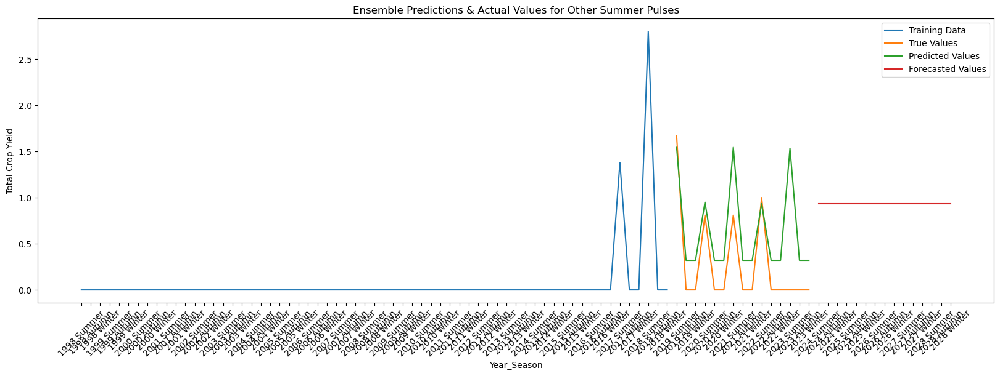

Epoch 1/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.4850  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3909
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5482
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4187
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4380
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4794
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4003 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3783 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3618
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3177
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Root Mean Squared Error (RMSE) for Gram: 0.09116041943869187


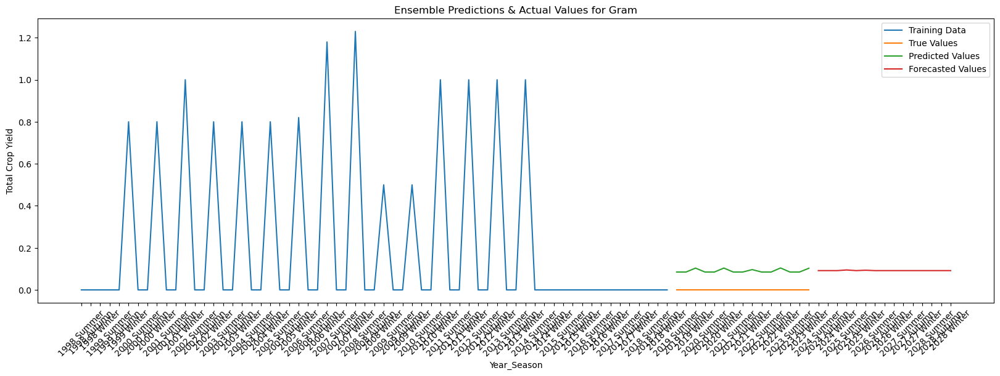

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.6301  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9040
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3032
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4361
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4019
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6545
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6114 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4584
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4071 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4916
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('

Epoch 1/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.4177  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4584
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2344 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3836
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3371
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2513
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3765 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3275
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2914
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4291
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.5962  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3804
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4609 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3447
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5675
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3641
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3480
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4219 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3642 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3728
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.5678  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4992 
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7594 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3547 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6774 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6612 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4302 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.5346 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4470 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4553 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Root Mean Squared Error (RMSE) for Arhar/Tur: 0.22302240986673477


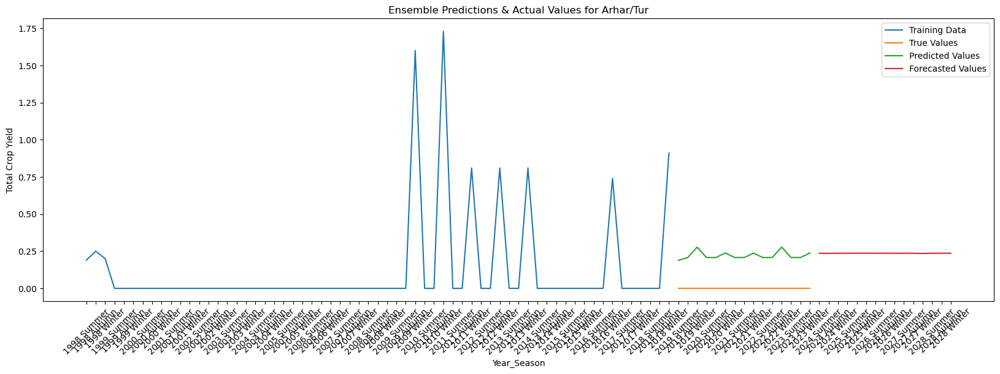

Epoch 1/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.5422  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3704 
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4981 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4567 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6295 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5035 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3785 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.4425
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.6166 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3780 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step
Root Mean Squared Error (RMSE) for Soyabean: 5.732575911751989e-05


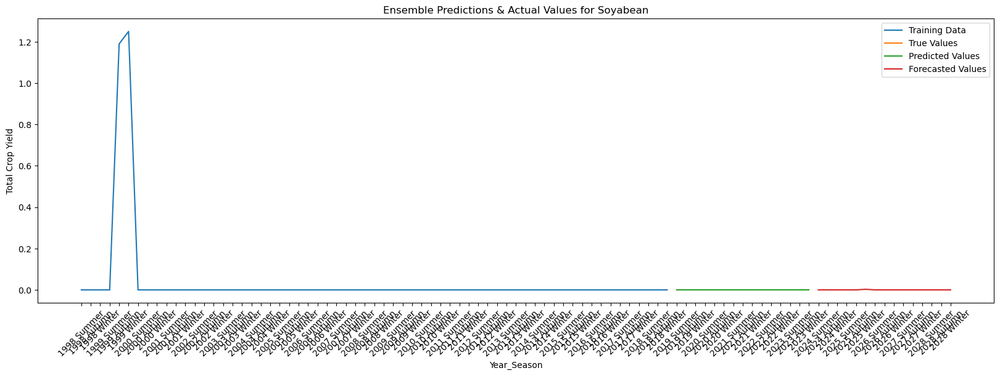

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.1147  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.1563 
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1475 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1257 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1200 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1374 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0961
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1451 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1064 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1442 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Root Mean Squared Error (RMSE) for Coriander: 0.001642282698107077


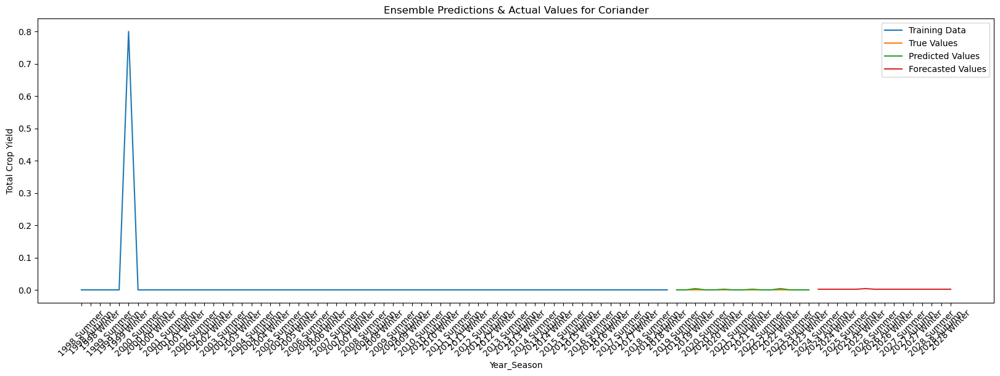

Epoch 1/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.0187  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0290
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1084
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2325
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9574 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8973
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0934 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.8299 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0757 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0298
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Epoch 1/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.5599  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.3748
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0504 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0920
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━

/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.6964  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6773 
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.6471 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7702
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7744
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7980 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4631 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5934
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7125 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9657 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Root Mean Squared Error (RMSE) for Wheat: 1.0383034172637993


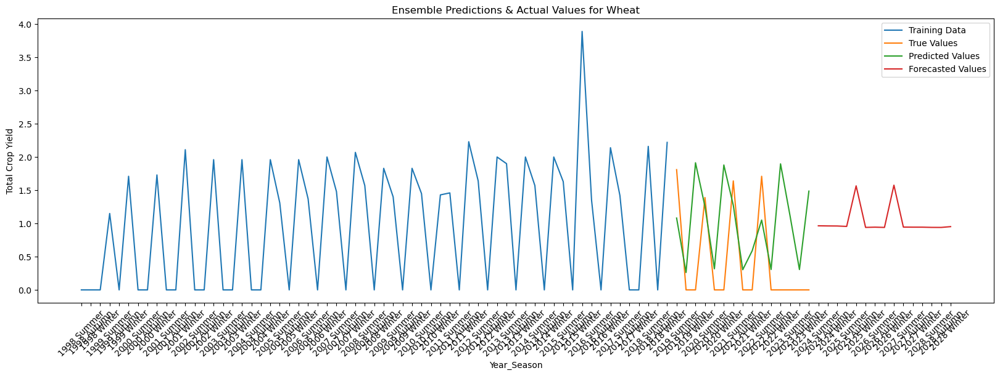

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.4812  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5205
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2843 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6012 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4608
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3750
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4109
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3487 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3615 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3529
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.7281  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5495
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6509 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6950 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5914 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6611 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7671 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6664 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5730 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4952
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Root Mean Squared Error (RMSE) for Small Millets: 0.2918811361892876


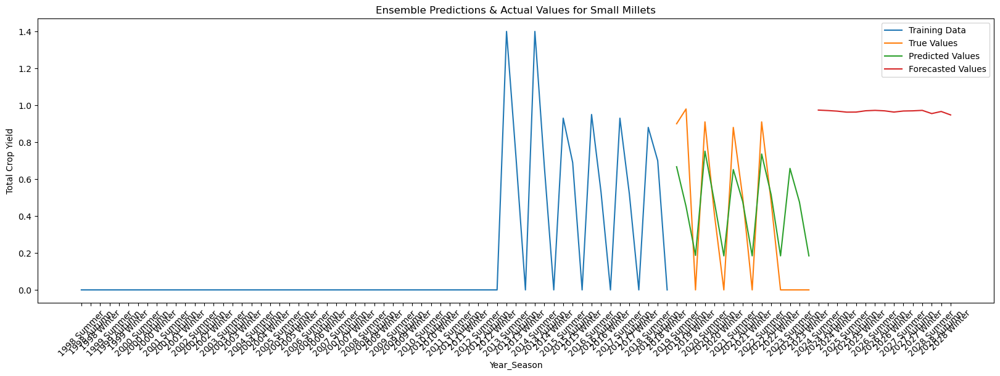

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.6466  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8147
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7184 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5899 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8136
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6635
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5164 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7746 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7238
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6180
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.7805  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9380
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9603
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0536 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.4888 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9585
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0871
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0224 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.0603 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0015
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Root Mean Squared Error (RMSE) for Sannhamp: 0.45050386601504633


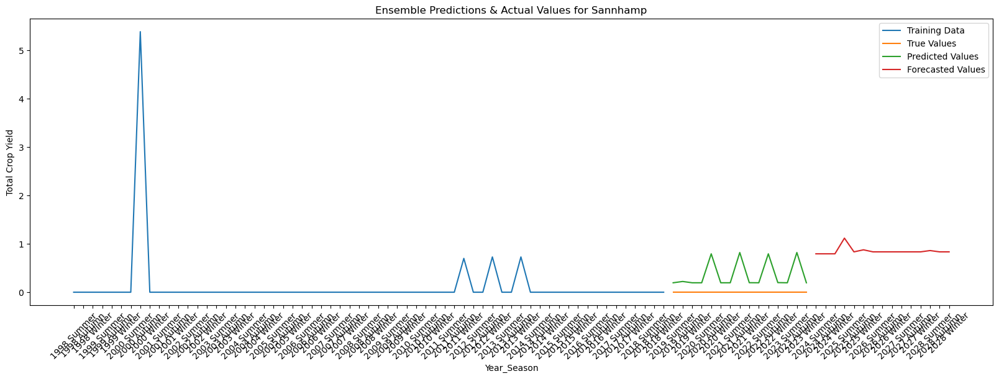

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.6831  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.2908 
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.6981 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.5020 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.5904 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.5984 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1852 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2200 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.6610
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.1697 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step
Root Mean Squared Error (RMSE) for Tobacco: 0.6378721634034963


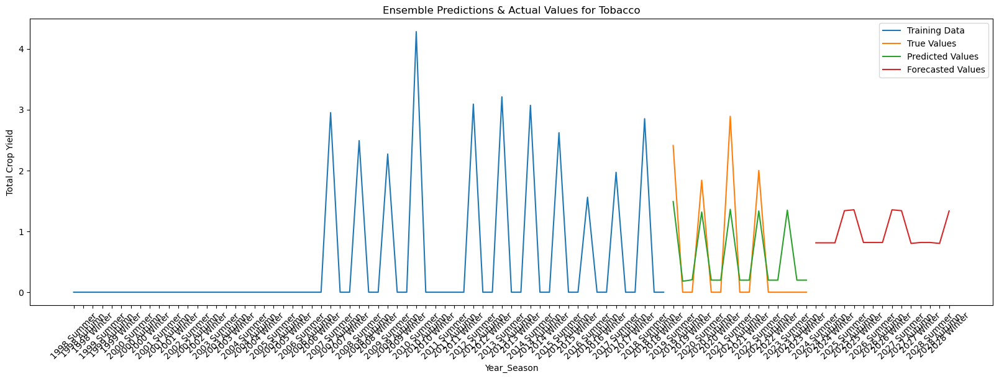

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.6569  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4534
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6450 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6557 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6865
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3055
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5636
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4909 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5214
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3925
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Root Mean Squared Error (RMSE) for Tapioca: 0.03866710091381118


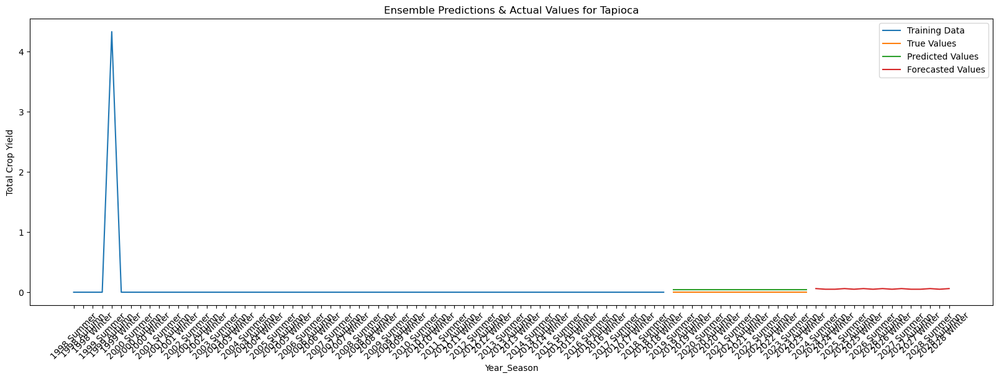

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.5179  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5772
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5631 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5944 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5622
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4320
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4984 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3611
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4221 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4898
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Root Mean Squared Error (RMSE) for Pulses Total: 0.00345891134538176


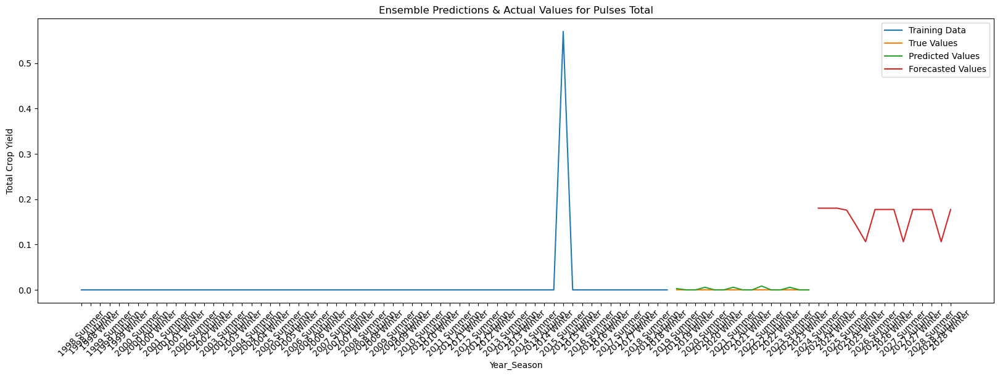

Epoch 1/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.5821  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5848
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8367
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5778 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8320 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8444 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6101
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5126 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6876 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7366 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
Root Mean Squared Error (RMSE) for Sweet potato: 0.00015506147958017615


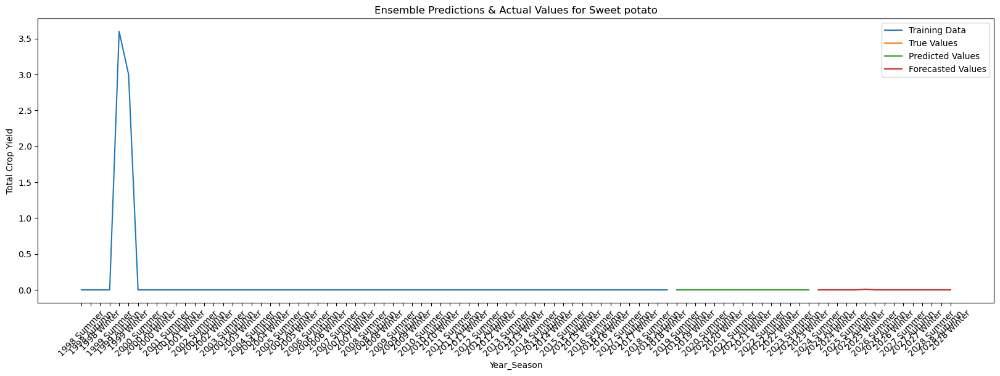

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.7403  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.5050
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8451 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5784
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7429 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8156 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7764
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8364 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7453 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6524
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
Root Mean Squared Error (RMSE) for Total Foodgrain: 0.14180101028923803


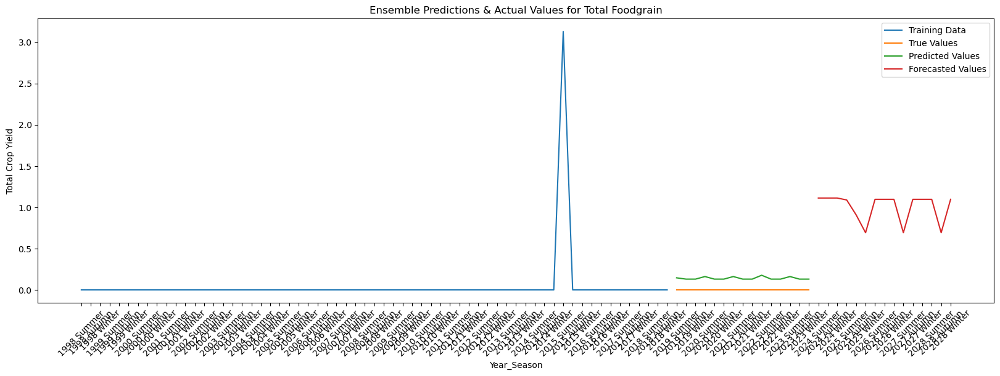

Epoch 1/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.4009  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4138
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4725
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5161
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5408 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3239
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4306 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4346
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3646 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3705 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Root Mean Squared Error (RMSE) for Turmeric: 0.15540592015714416


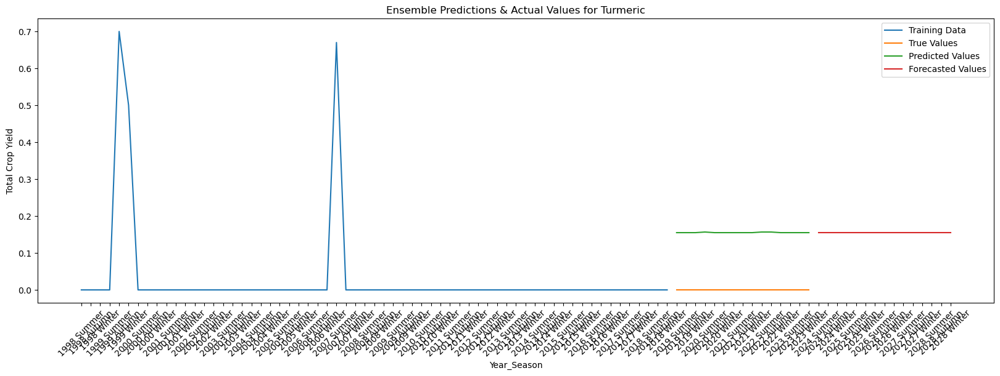

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.7805  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5461
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5495 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6434 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5203
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4023
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5610 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8044 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5797 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4732 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
Root Mean Squared Error (RMSE) for Other Rabi Pulses: 0.2131533525148956


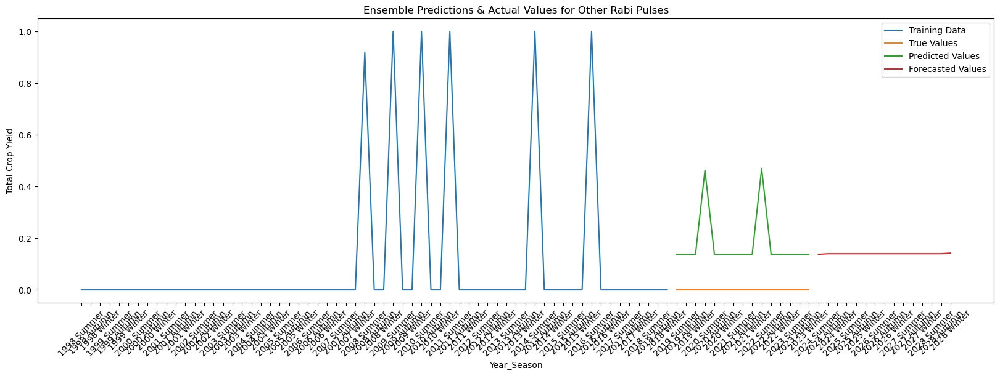

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressive parameters'
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'


2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 21.3529  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 19.4148 
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 23.3517 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 20.4454
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 16.3829
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 14.0428
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 20.7262 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 14.6126
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 24.9746
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 14.0558
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Root Mean Squared Error (RMSE) for Brinjal: 0.8121382021825057


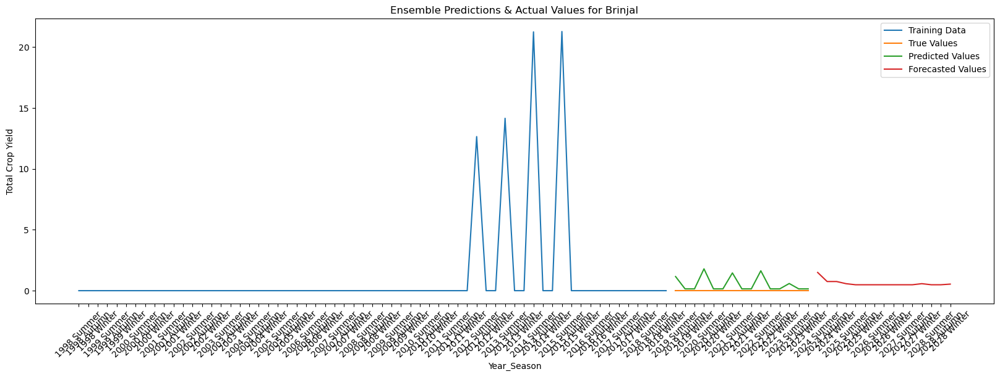

Average Ensemble RMSE for State Level: 2.860222828663774


In [6]:
df_ensemble = hist_df
df_ensemble_future = future_df

def map_season(season):
    return '1' if season == 'Summer' else ('2' if season == 'Autumn' else '3')

df_ensemble['Year_Season'] = df_ensemble.apply(lambda row: str(row['year']) + ' ' + map_season(row['season']) +' ' + row['season'], axis=1)
df_ensemble = df_ensemble.sort_values('Year_Season')
df_ensemble.reset_index(drop=True, inplace=True)
df_ensemble_future['Year_Season'] = df_ensemble_future.apply(lambda row: str(row['year']) + ' ' + map_season(row['season']) +' ' + row['season'], axis=1)
df_ensemble_future = df_ensemble_future.sort_values('Year_Season')
df_ensemble_future.reset_index(drop=True, inplace=True)

ensemble_rmse_scores = []

for crop in df_ensemble['crop'].unique():
    df_crop = df_ensemble[df_ensemble['crop'] == crop]
    df_crop.reset_index(drop=True, inplace=True)
    df_future_crop = df_ensemble_future[df_ensemble_future['crop'] == crop]
    df_future_crop.reset_index(drop=True, inplace=True)
    
    # Storing predicted values from 2019 to 2023
    rf_all_states_per_crop = []
    gb_all_states_per_crop = []
    arima_all_states_per_crop = []
    attention_lstm_all_states_per_crop = []
    
    # Storing predicted values from 2024 to 2028
    rf_all_states_per_crop_forecast = []
    gb_all_states_per_crop_forecast = []
    arima_all_states_per_crop_forecast = []
    attention_lstm_all_states_per_crop_forecast = []
    
    true_values_all_states_per_crop = []
    train_values = []
    
    for state in df_crop['state'].unique():
        df_crop_state = df_crop[df_crop['state']==state]
        df_crop_state.reset_index(drop=True, inplace=True)
        df_future_crop_state = df_future_crop[df_future_crop['state']==state]
        df_future_crop_state.reset_index(drop=True, inplace=True)

        df_crop_state_train = df_crop_state[df_crop_state['year']<=2018]
        df_crop_state_test = df_crop_state[df_crop_state['year']>=2019]
        df_crop_state_train = df_crop_state_train.drop(columns=['year', 'season', 'state', 'crop', 'Year_Season'])
        df_crop_state_test = df_crop_state_test.drop(columns=['year', 'season', 'state', 'crop', 'Year_Season'])
        X_future = df_future_crop_state.drop(columns=['year', 'season', 'state', 'crop', 'Year_Season'])
        
        X_train = df_crop_state_train.drop(columns=['yield'])
        y_train = df_crop_state_train['yield']
        X_test = df_crop_state_test.drop(columns=['yield'])
        y_test = df_crop_state_test['yield']
        train_values.append(y_train)
        true_values_all_states_per_crop.append(y_test)
        
        # Random Forest
        rf_model = RandomForestRegressor(n_estimators=100, random_state=42, max_depth=6)
        rf_model.fit(X_train, y_train)
        rf_y_pred = rf_model.predict(X_test)
        rf_all_states_per_crop.append(rf_y_pred)
        rf_prediction_future = rf_model.predict(X_future)
        rf_all_states_per_crop_forecast.append(rf_prediction_future)
        
        # Gradient Boosting
        gb_model = GradientBoostingRegressor(n_estimators=100, random_state=42, max_depth=6, learning_rate=0.05)
        gb_model.fit(X_train, y_train)
        gb_y_pred = gb_model.predict(X_test)
        gb_all_states_per_crop.append(gb_y_pred)
        gb_prediction_future = gb_model.predict(X_future)
        gb_all_states_per_crop_forecast.append(gb_prediction_future)
        
        # ARIMA
        best_params = {}
        best_rmse = {}
        p_values = range(0, 2) 
        d_values = range(0, 2) 
        q_values = range(0, 2) 
        best_params[state] = (1,1,1)
        best_rmse[state] = float('inf')
        
        # Perform grid search for the current state and crop
        for p, d, q in product(p_values, d_values, q_values):
            if p == 0 and d == 0 and q == 0:
                continue

            # Train ARIMA model
            order = (p, d, q)
            model = ARIMA(y_train, order=order)
            try:
                fit_model = model.fit()
                forecast = fit_model.forecast(steps=len(y_test))
                rmse = np.sqrt(mean_squared_error(y_test, forecast))
                if rmse < best_rmse[state]:
                    best_rmse[state] = rmse
                    best_params[state] = order
            except:
                continue

        # Train ARIMA model with best parameters for the current state and crop
        arima_model = ARIMA(y_train, order=best_params[state])
        arima_fit_model = arima_model.fit()

        # Forecast with best model for the current state and crop
        forecast = arima_fit_model.forecast(steps=15+15)

        # Store forecasted yield for the current state
        arima_all_states_per_crop.append(forecast[:15])
        arima_all_states_per_crop_forecast.append(forecast[15:])
        
        # Attention and LSTM
        class Attention(tf.keras.layers.Layer):
            def __init__(self, units):
                super(Attention, self).__init__()
                self.W = tf.keras.layers.Dense(units)
                self.V = tf.keras.layers.Dense(1)
                
            def call(self, inputs):
                score = tf.nn.tanh(self.W(inputs))
                attention_weights = tf.nn.softmax(self.V(score), axis=1)
                context_vector = attention_weights * inputs
                context_vector = tf.reduce_sum(context_vector, axis=1)
                return context_vector
            
        def build_model():
            inputs = Input(shape=(X_train_reshaped.shape[1], X_train_reshaped.shape[2]))
            lstm_out = LSTM(64, return_sequences=True)(inputs)
            dropout = Dropout(0.2)(lstm_out)
            batch_norm = BatchNormalization()(dropout)
            attention = Attention(64)(batch_norm)
            output = Dense(1)(attention)
            model = Model(inputs=inputs, outputs=output)
            return model
        
        # Reshape X_train for input to the model
        X_train_reshaped = X_train.values.reshape(X_train.shape[0], 1, X_train.shape[1])
        
        # Reshape X_future for input to the model
        X_test_reshaped = X_test.values.reshape(X_test.shape[0], 1, X_test.shape[1])
        
        attention_lstm_model = build_model()
        attention_lstm_model.compile(optimizer="adam", loss="mse")
        attention_lstm_model.fit(X_train_reshaped, y_train, epochs=10, batch_size=32)

        # Predict using the model
        predicted_target_values = attention_lstm_model.predict(X_test_reshaped)

        # Post-process the predicted target values
        predicted_values = [item[0] for item in predicted_target_values]
        predicted_values_non_negative = [max(value, 0) for value in predicted_values] 
        attention_lstm_all_states_per_crop.append(predicted_values_non_negative)
        
        # Reshape X_future for input to the model
        X_future_reshaped = X_future.values.reshape(X_future.shape[0], 1, X_future.shape[1])

        # Predict using the model
        forecast_target_values = attention_lstm_model.predict(X_future_reshaped)

        # Post-process the predicted target values
        forecast_values = [item[0] for item in forecast_target_values]
        forecast_values_non_negative = [max(value, 0) for value in forecast_values] 
        attention_lstm_all_states_per_crop_forecast.append(forecast_values_non_negative)
        
    rf_result_per_crop = [sum(values) for values in zip(*rf_all_states_per_crop)] 
    gb_result_per_crop = [sum(values) for values in zip(*gb_all_states_per_crop)] 
    arima_result_per_crop = [sum(values) for values in zip(*arima_all_states_per_crop)] 
    attention_lstm_result_per_crop = [sum(values) for values in zip(*attention_lstm_all_states_per_crop)]
    true_values_result_per_crop = [sum(values) for values in zip(*true_values_all_states_per_crop)] 
    train_values = [sum(values) for values in zip(*train_values)] 
    
    array_rf = np.array(rf_result_per_crop)
    array_gb = np.array(gb_result_per_crop)
    array_arima = np.array(arima_result_per_crop)
    array_attention_lstm = np.array(attention_lstm_result_per_crop)
    averages = (array_rf + array_gb + array_arima + array_attention_lstm) / 4
    
    rf_result_per_crop_forecast = [sum(values) for values in zip(*rf_all_states_per_crop_forecast)] 
    gb_result_per_crop_forecast = [sum(values) for values in zip(*gb_all_states_per_crop_forecast)] 
    arima_result_per_crop_forecast = [sum(values) for values in zip(*arima_all_states_per_crop_forecast)] 
    attention_lstm_result_per_crop_forecast = [sum(values) for values in zip(*attention_lstm_all_states_per_crop_forecast)]
    
    array_rf_forecast = np.array(rf_result_per_crop_forecast)
    array_gb_forecast = np.array(gb_result_per_crop_forecast)
    array_arima_forecast = np.array(arima_result_per_crop_forecast)
    array_attention_lstm_forecast = np.array(attention_lstm_result_per_crop_forecast)
    forecast = (array_rf_forecast + array_gb_forecast + array_arima_forecast + array_attention_lstm_forecast) / 4
    
    rmse = np.sqrt(mean_squared_error(true_values_result_per_crop, averages))
    ensemble_rmse_scores.append(rmse)
    print(f"Root Mean Squared Error (RMSE) for {crop}: {rmse}")
    
    # Plotting the results for the current crop
    plt.figure(figsize=(20, 6))
    plt.plot(list(range(1, 64)), train_values, label='Training Data')
    plt.plot(list(range(64, 79)), true_values_result_per_crop, label='True Values')
    plt.plot(list(range(64, 79)), averages, label='Predicted Values')
    plt.plot(list(range(79, 94)), forecast, label='Forecasted Values')
    plt.xlabel('Year_Season')
    plt.ylabel('Total Crop Yield')
    plt.title(f'Ensemble Predictions & Actual Values for {crop}')
    seasons = ['Summer', 'Autumn', 'Winter']
    years = range(1998, 2029)
    custom_labels = [f"{year} {season}" for year in years for season in seasons]
    plt.xticks(range(1, 94), custom_labels, rotation=45)
    plt.legend()
    plt.show()
    

avg_ensemble_rmse = np.mean(ensemble_rmse_scores)
print("Average Ensemble RMSE for State Level:", avg_ensemble_rmse)

### Running Ensemble on Country Level

Epoch 1/10


/var/folders/nx/_bvgjl1d7hg01rqvr_jylx_h0000gn/T/ipykernel_9463/2055328300.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_ensemble['Year_Season'] = df_ensemble.apply(lambda row: str(row['year']) + ' ' + map_season(row['season']) +' ' + row['season'], axis=1)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/pyt

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 37.0900 
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 70.3424 
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 36.4694
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 70.8194  
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 68.1411 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 36.5943
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 36.3723
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 67.9643  
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 36.3111
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 37.3018
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


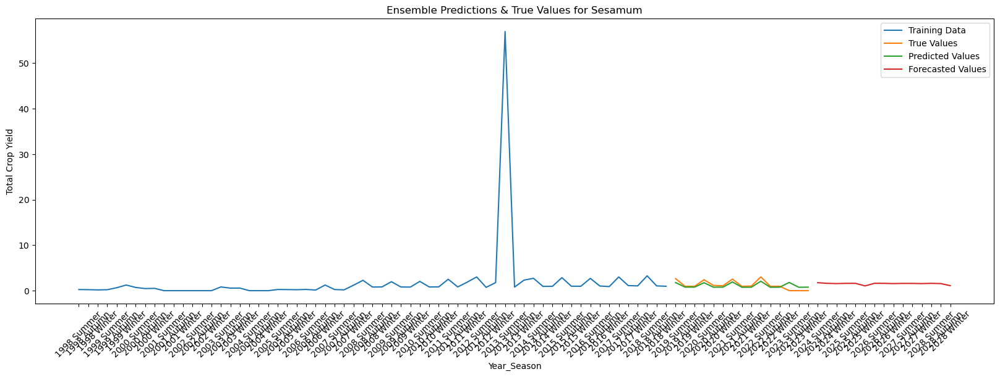

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodel

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 12.0540  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 12.4157
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 11.3761 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 9.2417
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 11.4795 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 9.0521 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 10.9925 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 9.8966 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 10.9597
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 9.2951 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


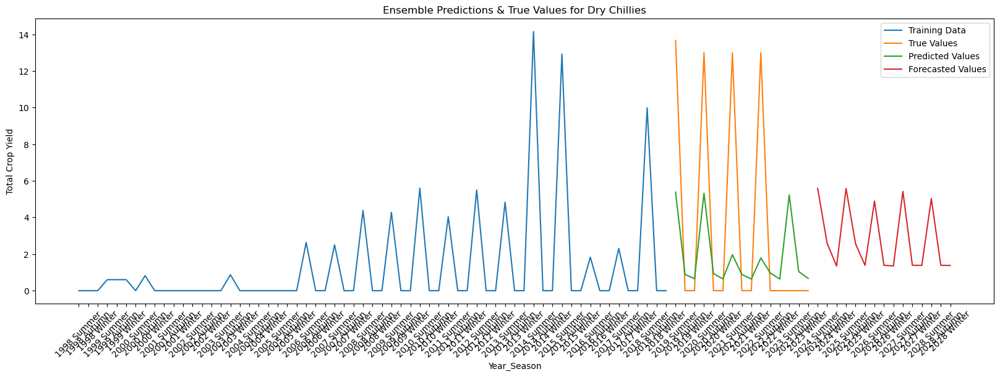

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodel

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.4519  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6005
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3620
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4575
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4719
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4475 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4983 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4978
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4114 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4051
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


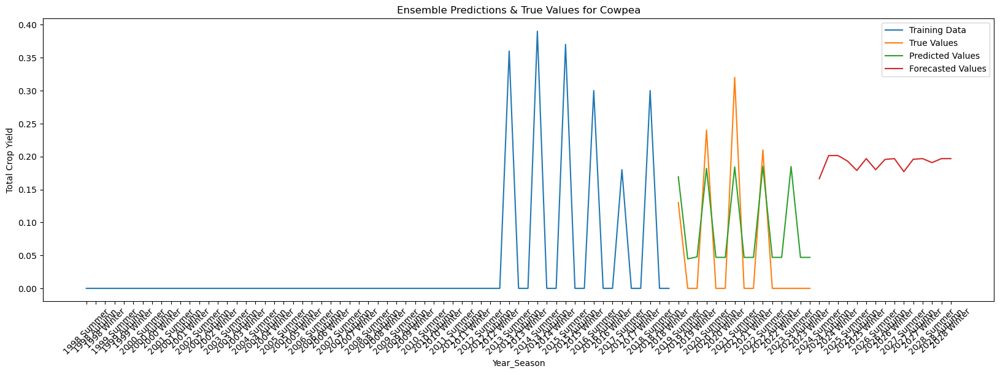

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodel

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.3029  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.5362
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.3894
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.4162
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0230
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2426
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.3152
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.1314 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8352 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9787
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


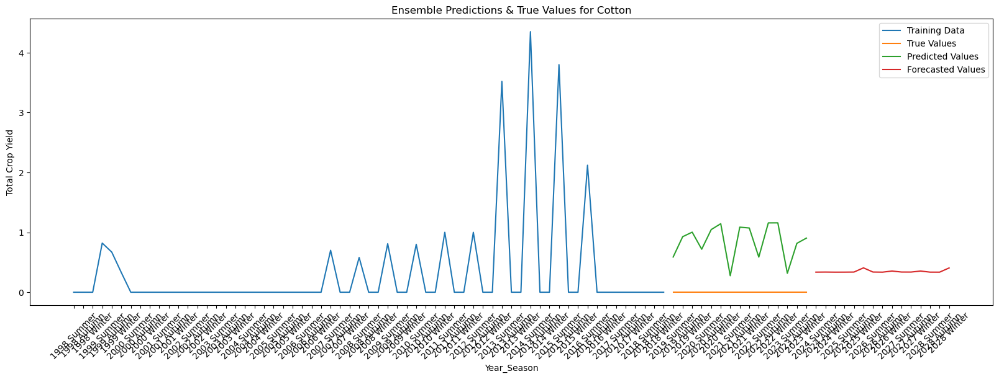

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodel

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.0392  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.7851 
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.7539 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.4312
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.4832
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.9890 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.7501
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.9572
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.3874
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.7581 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


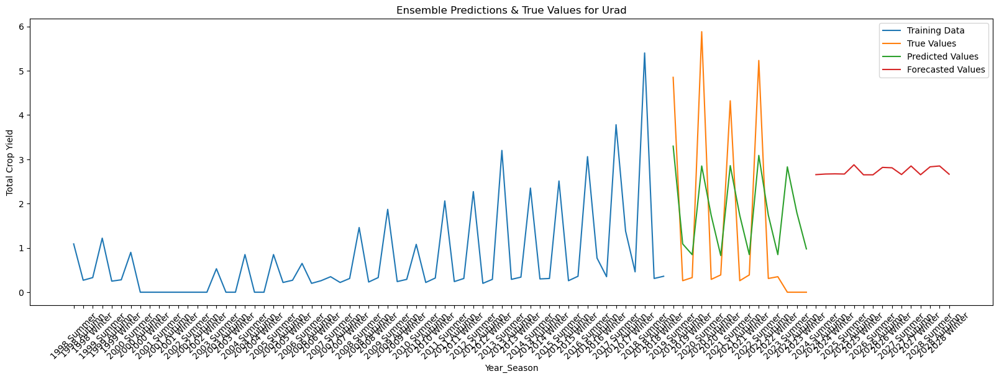

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodel

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.5058  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5164
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4112
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3845
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2882 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3025 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3120 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2950 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3554
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3452 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


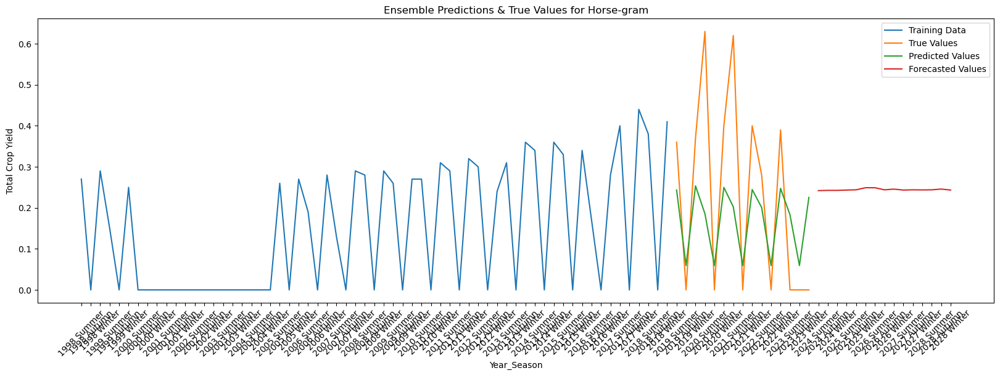

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodel

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 16.2396  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 17.3876
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 16.2771
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 14.5578
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 14.6949
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 15.1199 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 16.0384
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 16.5392 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 13.5246 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 15.1256 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


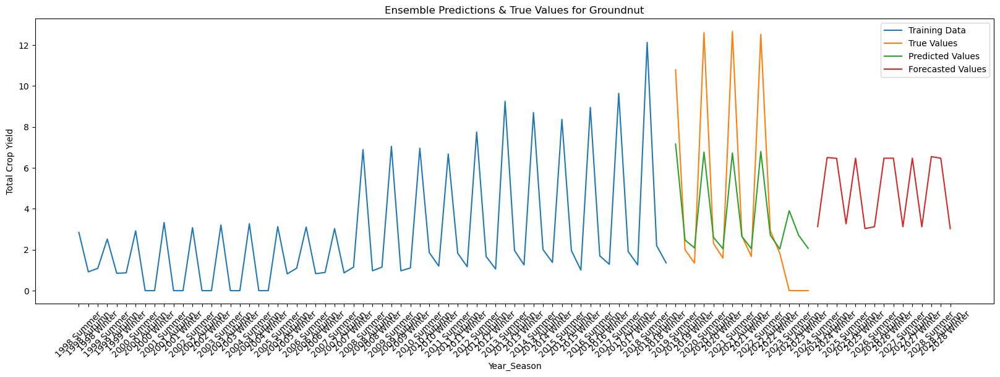

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodel

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 6.8701  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 6.4471
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 5.5960
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 5.6743
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 5.8507 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 6.1006 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 6.3704 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 5.4831 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 6.3840
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 6.1030 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


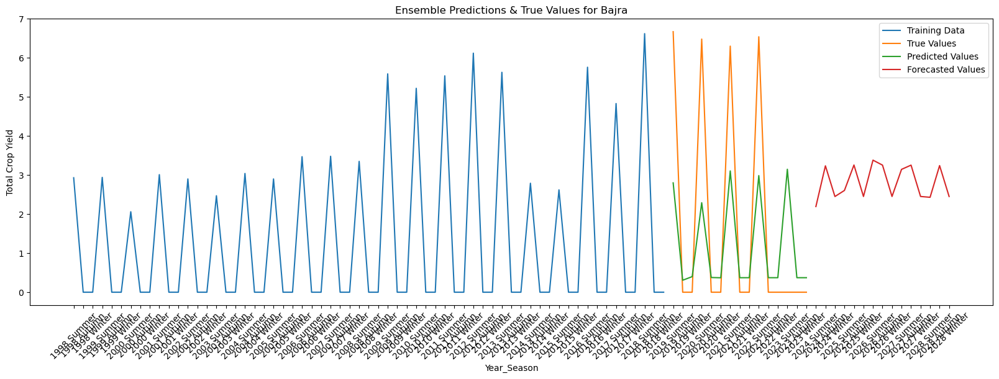

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodel

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.8521  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7541
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7381
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7135
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9960
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7705 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8756 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9789 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6158 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5876 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


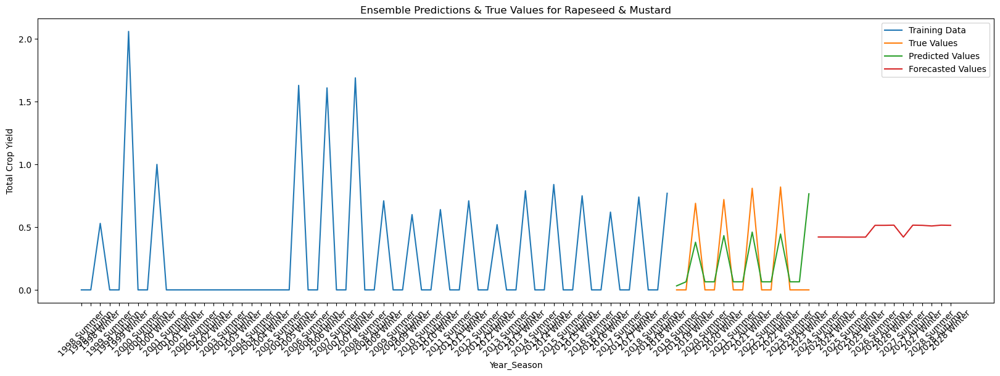

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodel

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 4666.0747  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 5212.2109
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 4593.0352 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 4920.9224
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 4103.8696 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 4513.0049
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 4596.9561 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 4303.7920 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 4498.7246 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 3818.3264
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


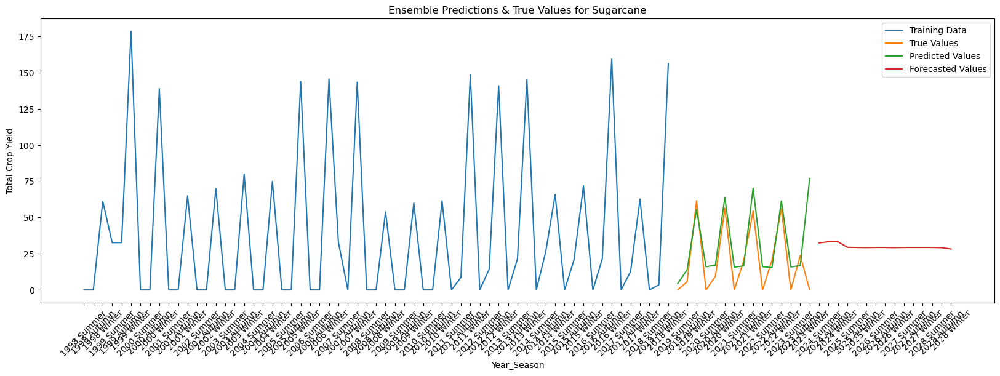

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodel

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 14.1400  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 13.5541
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 14.0024 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 13.4097 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 10.8761
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 13.9670
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 15.1125 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 11.1870
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 14.3130
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 13.8170 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


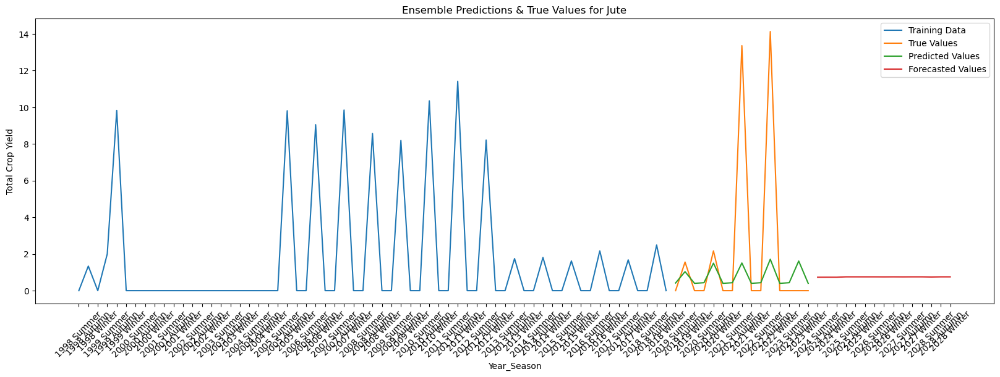

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodel

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.8940  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7807
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7295
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7207 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7438
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8111
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6352
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8568 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7540 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5349
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


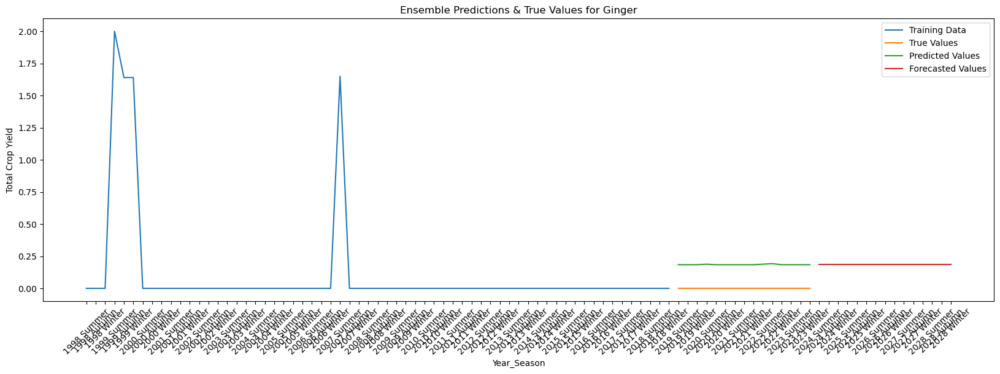

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodel

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 325.6847  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 288.2086
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 295.5878
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 314.2259
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 324.1753
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 264.8033 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 282.7099
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 300.3194
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 266.8554
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 270.1496
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


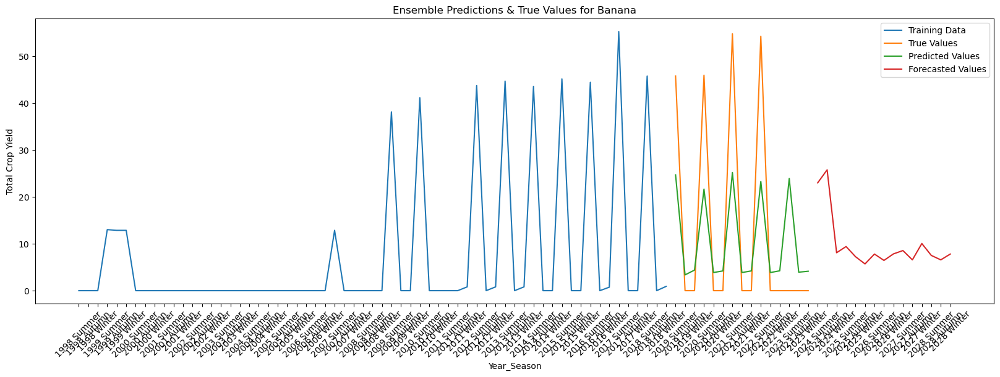

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodel

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 6.5411  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 6.1071
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 6.4175
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 6.6924 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 6.3323
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 6.8159 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 6.0389
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 6.0715
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 6.7026 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 5.3167 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


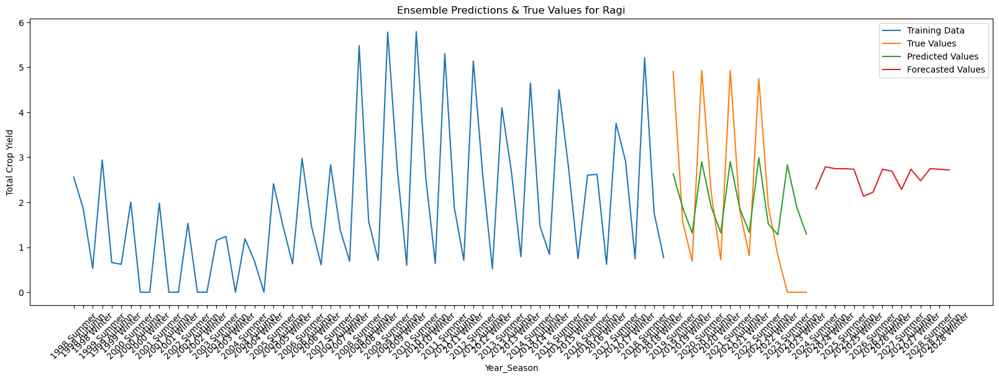

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodel

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 242.2312  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 249.9945
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 210.6957 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 235.2845 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 252.6847
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 233.4021
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 213.1561 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 234.3704 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 271.1631
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 238.0293 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


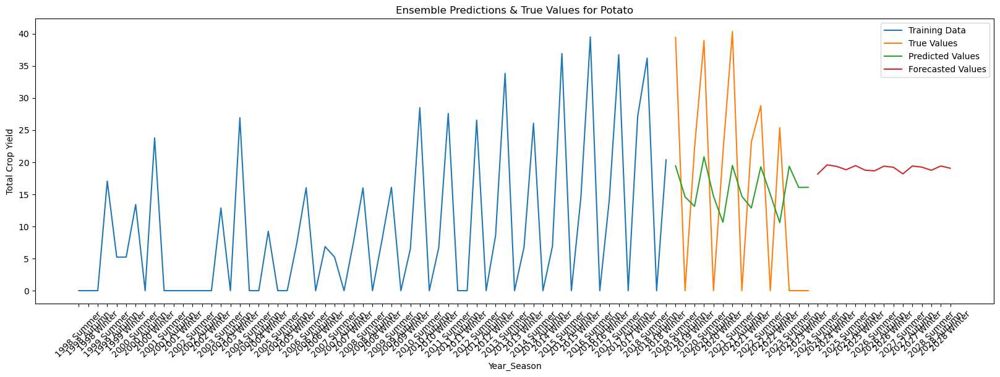

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodel

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 3.5815  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 4.6220
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 4.9251
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 5.3708
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 5.1883 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 3.7481 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 3.7093
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 6.3824 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 5.0639
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 5.3984 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


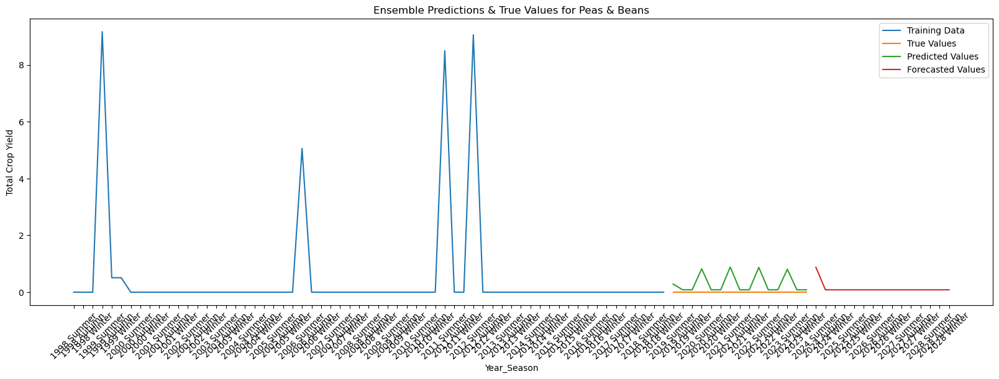

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodel

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.5855  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.9085
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.4140 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.9005 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.5730 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.4957
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.2867
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.6746 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.5098 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.7186 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


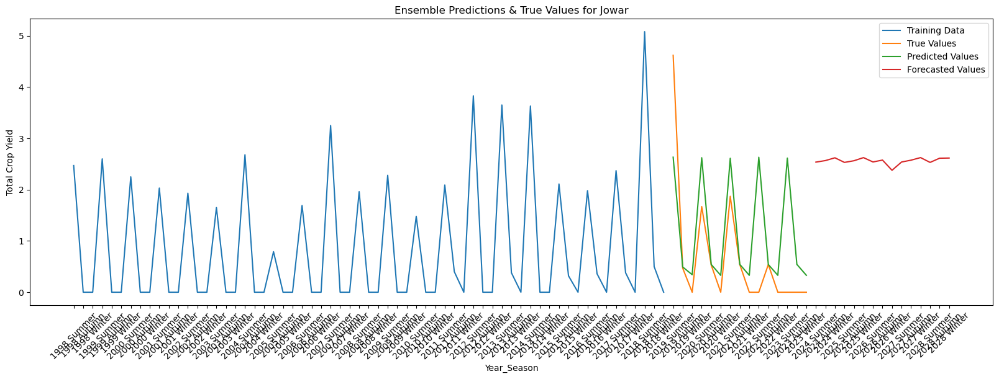

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodel

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.0008  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.6306
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.9610
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.7063
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.8431
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.5386
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.5425 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.0533
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.6727 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.0850
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


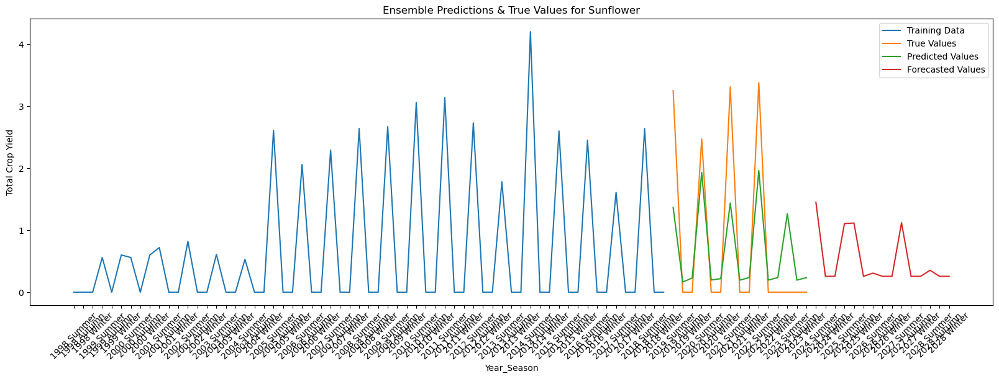

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodel

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 9578.4678
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 18490.1992
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 9590.7910
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 9570.0137
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 9599.3496
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 9566.9482
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 9573.0283
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 9586.2148
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 18495.5117 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 18433.2734
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


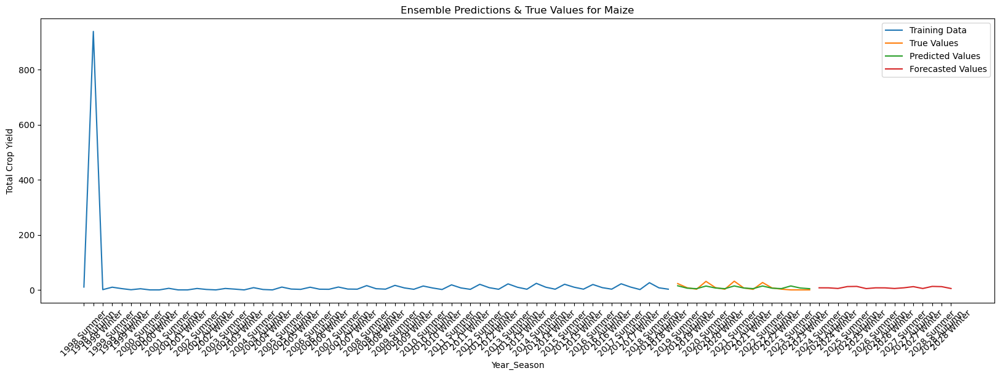

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodel

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 384.2061  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 380.9698 
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 390.8254
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 399.7641 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 368.3315 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 388.5237
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 376.3125
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 391.4459
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 386.9208 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 393.2263 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


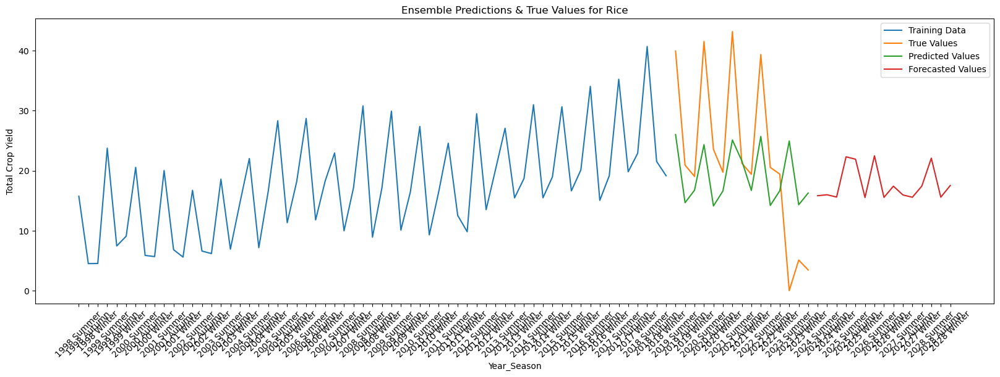

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodel

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 438.2943  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 539.1014
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 452.6483
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 417.5124
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 381.6175 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 516.0042 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 476.1140 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 478.5913
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 448.6542
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 496.8842 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


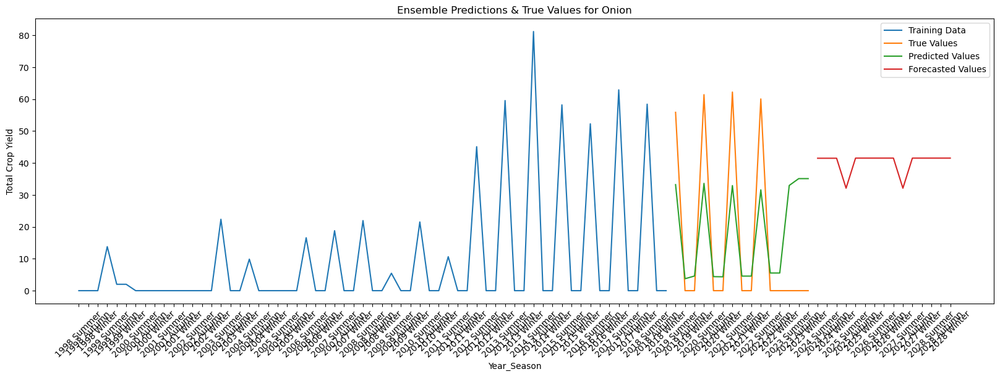

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodel

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.8768  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 3.3917
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 3.8720 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 3.4094
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 4.0798 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 3.5678
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 3.6125
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 3.7576
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.9724 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.7988
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


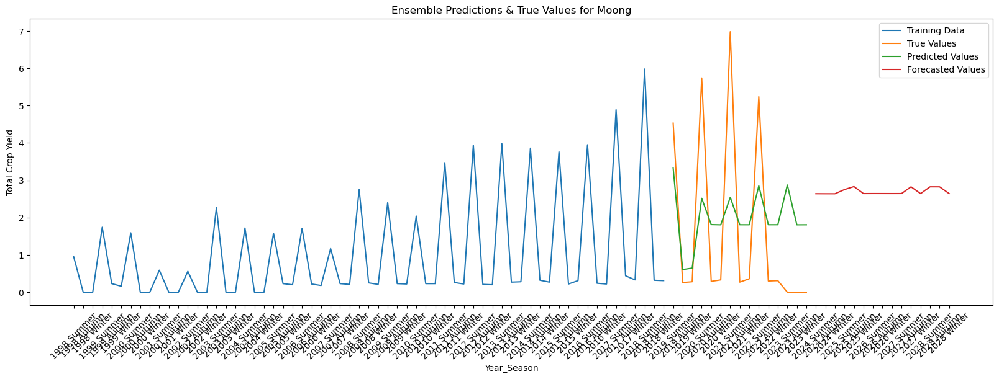

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodel

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.5673  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5442
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3803
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4698
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3859
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3067
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4638 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3864
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4349 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4483
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


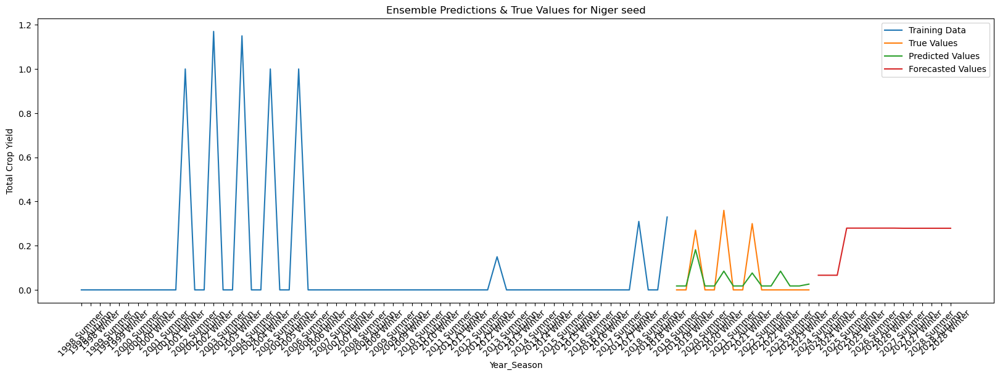

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodel

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.5926  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4997
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6368 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5132
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5011
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6335
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4915 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5823 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6859
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7577
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


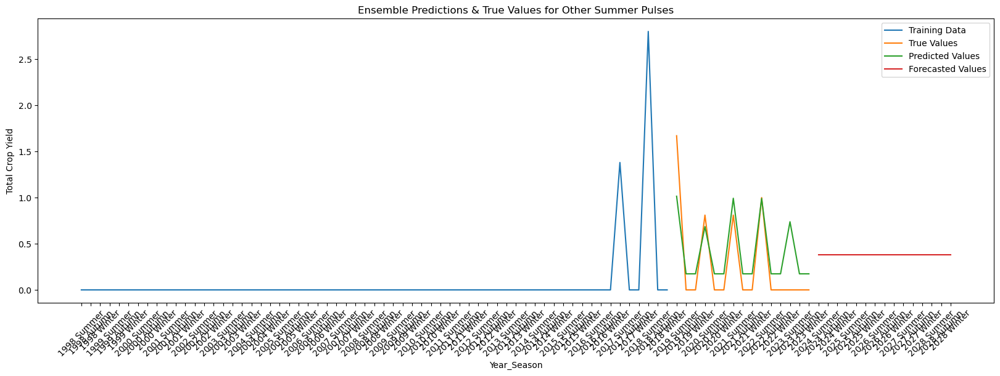

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodel

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.6678  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5063
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4718
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6200
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4871 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5169 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4872 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4621 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4573 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3714 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


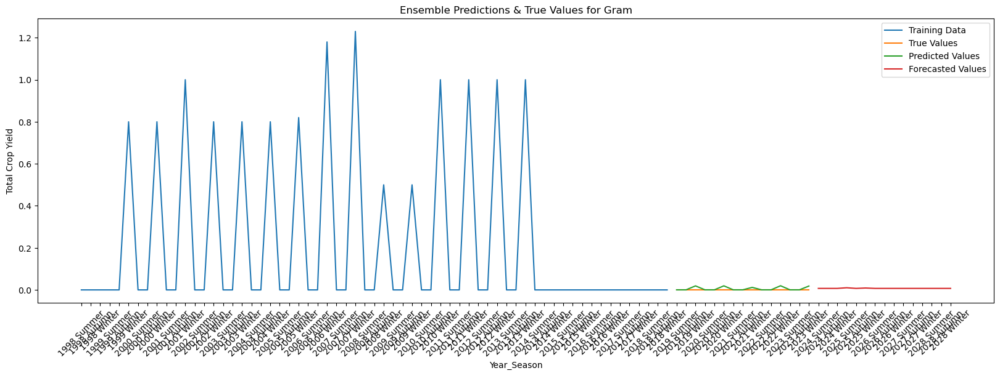

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodel

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.6402  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7518
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7521
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6479
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4892 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8029 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.6708
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7792
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7379 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5666 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


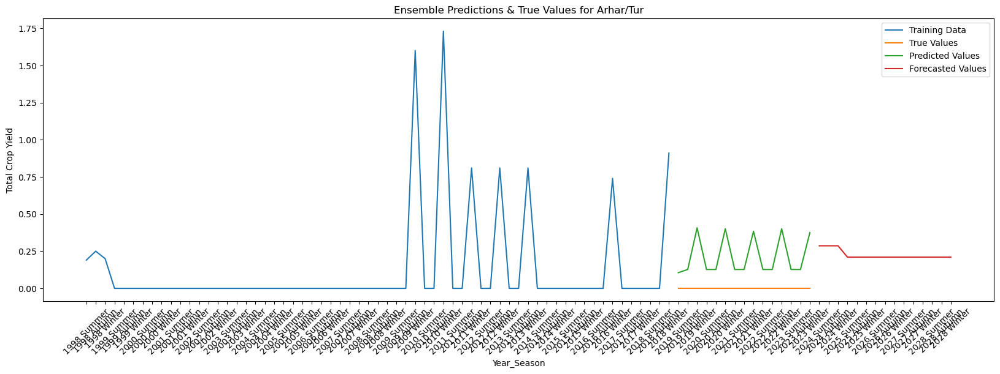

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodel

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.3344  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5022
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5062
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5788 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3302
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5641 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4349
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5431
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3523
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4855
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


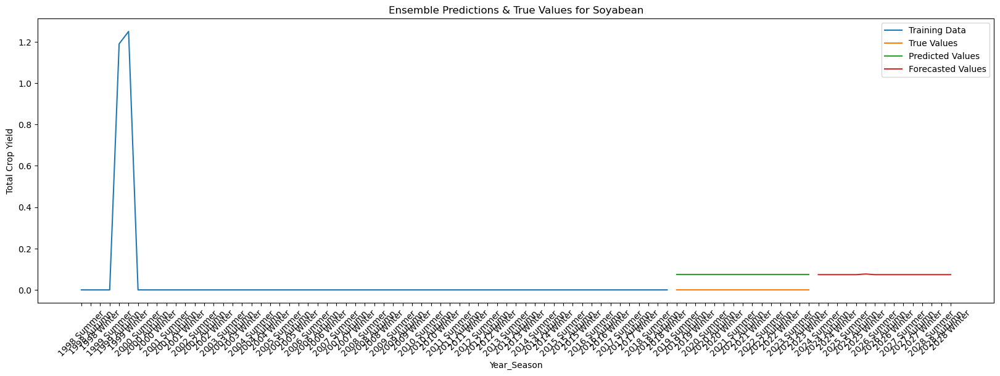

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodel

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.4819  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6294
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5636
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5626
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4432
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4162 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3803 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4362
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5546
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4584 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


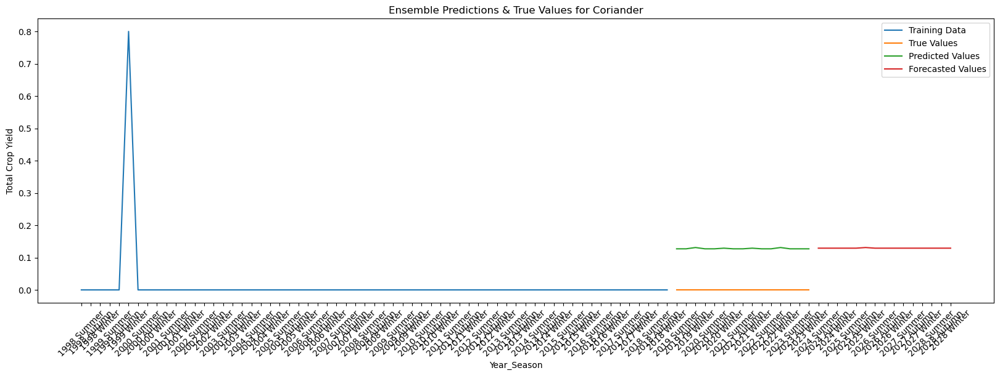

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodel

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 2.4259  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.2496
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.2044
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.6170
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.9898 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.4165 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.1321
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.0687
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.0494 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.1168
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


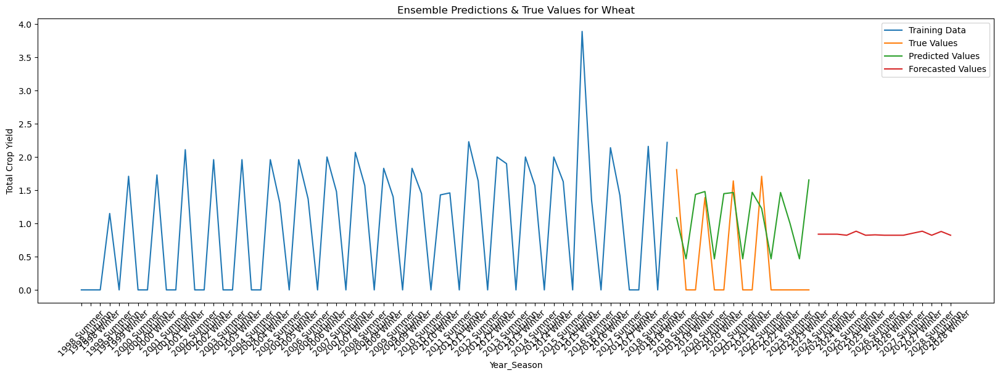

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodel

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.0009  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8382
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7563 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7584
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7582
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7306 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6466 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3539 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5703 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6440 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


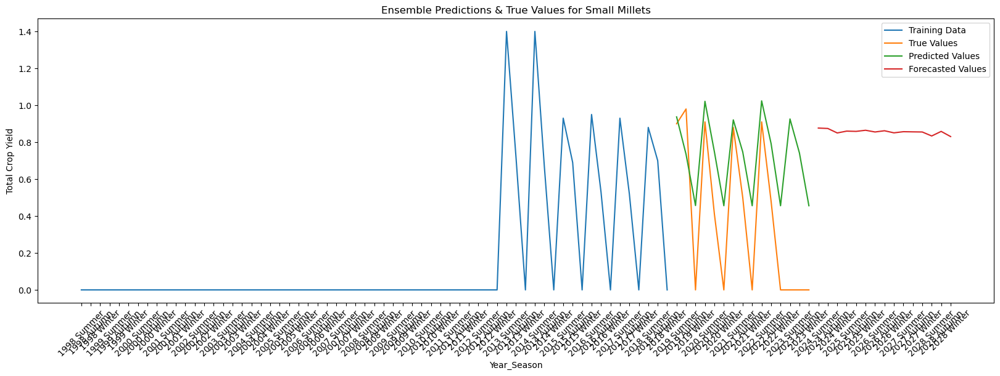

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodel

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.8879  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9738
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.9787
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0352 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0471 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.2400
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.0374 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.9303
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.3331 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8315 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


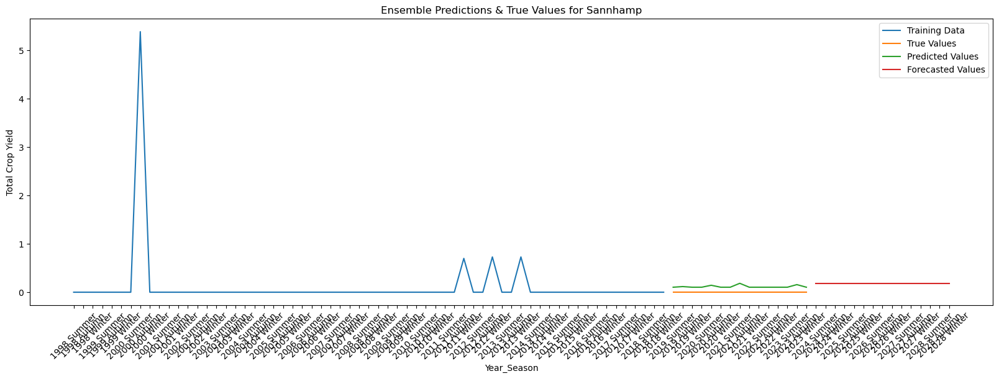

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodel

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 1.7169  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.5176
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.9966 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.9653 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.7734
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.4538 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.1619
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.3817
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.7133 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.6952 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


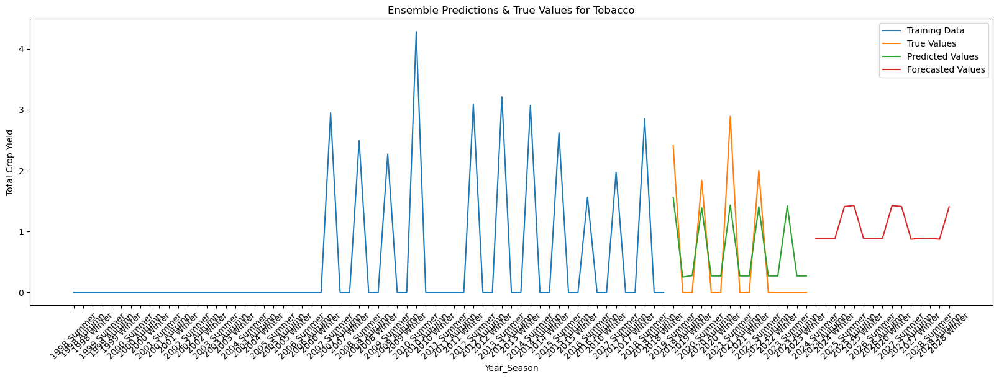

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodel

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.7386  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6177
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7481 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7688 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3968
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4210
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3206 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4978
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.6822
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7171 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


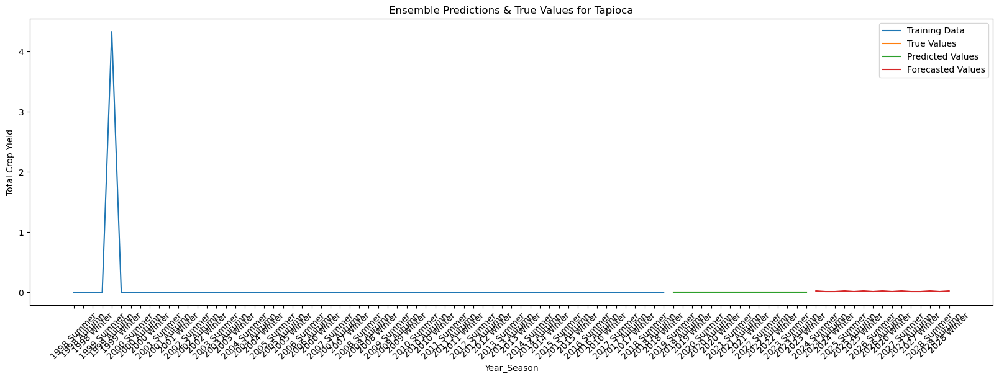

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodel

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.3199  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2771
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4219
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.3030
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3246
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.2604 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2923 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.2465 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2475 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.2352
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


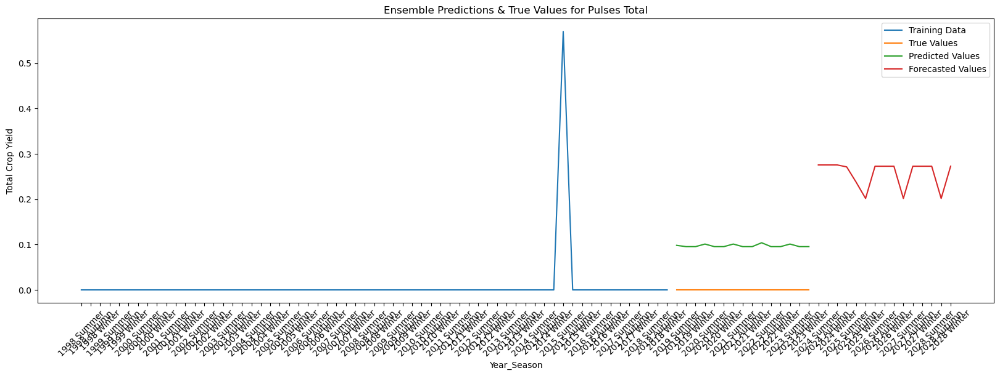

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodel

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.4119  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5574 
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5443 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8082 
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5179 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6691 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4544
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6403
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5641 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4755 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


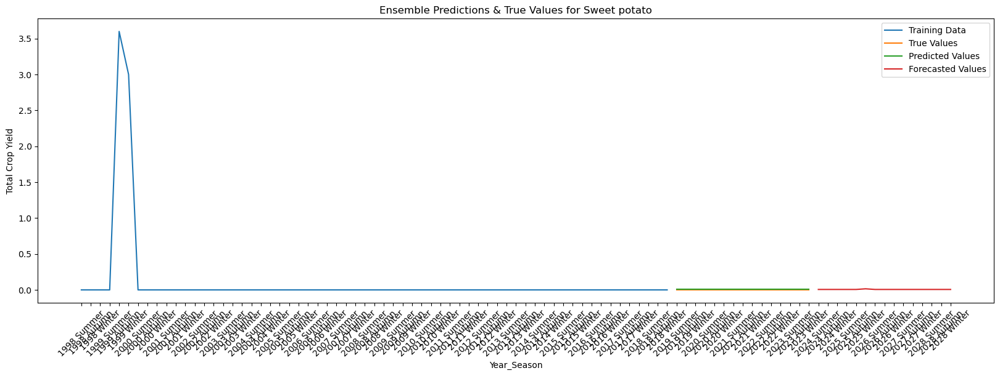

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodel

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.7039  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6212
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6786
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.8320
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6852 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5806 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7972
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4041
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4533
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4158 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


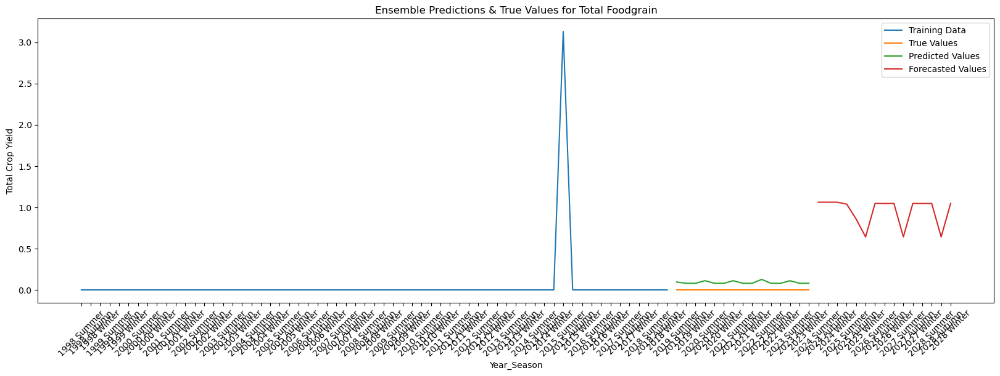

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodel

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.5372  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5366 
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3985 
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4807
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4829 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4475 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.5245 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5690 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4639 
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.3659
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


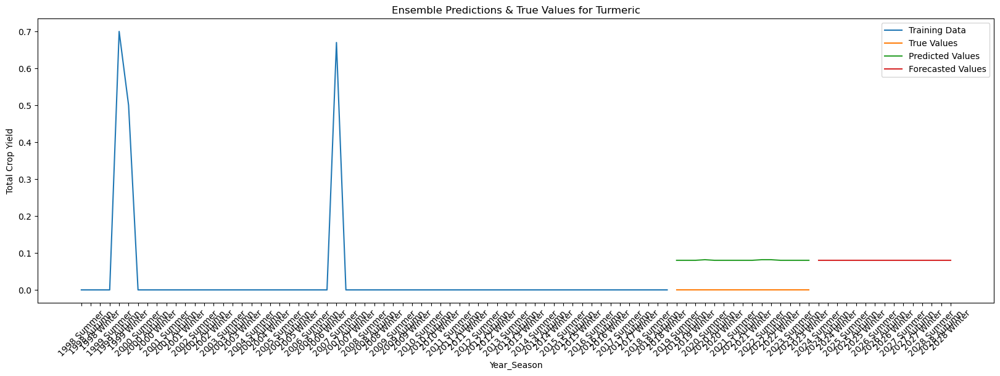

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodel

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.8141  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6197
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.4648
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.7072
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5107
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.6297 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5149 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.5055
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5689
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.5743 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


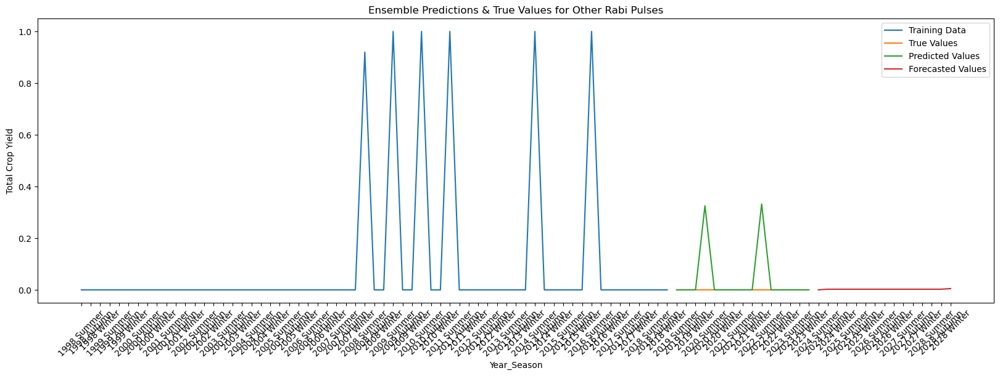

Epoch 1/10


/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/vanyabendatu/opt/anaconda3/lib/python3.9/site-packages/statsmodel

2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 18.3218  
Epoch 2/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 20.1989 
Epoch 3/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 20.8247
Epoch 4/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 20.2005
Epoch 5/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 23.8929 
Epoch 6/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 19.2583 
Epoch 7/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 25.3761 
Epoch 8/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 18.4707 
Epoch 9/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 21.3756
Epoch 10/10
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 17.1824
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


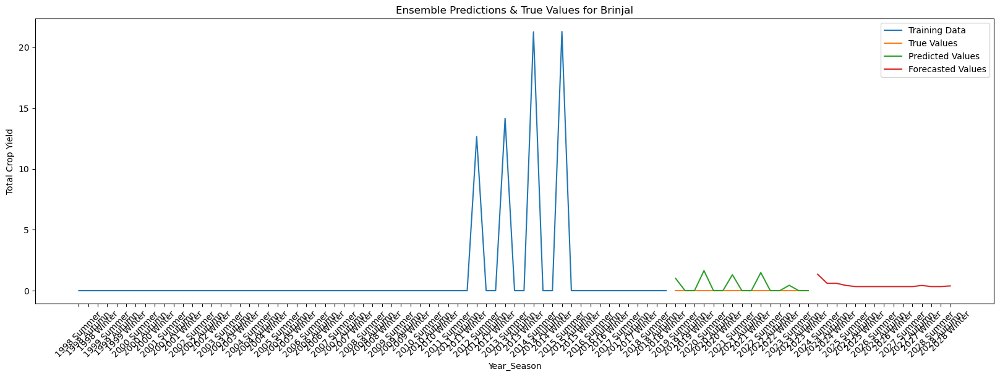

Average Ensemble RMSE for Country Level: 3.1711736584869854


In [7]:
df_ensemble = hist_df
df_ensemble_future = future_df

def map_season(season):
    return '1' if season == 'Summer' else ('2' if season == 'Autumn' else '3')

df_ensemble['Year_Season'] = df_ensemble.apply(lambda row: str(row['year']) + ' ' + map_season(row['season']) +' ' + row['season'], axis=1)
df_ensemble = df_ensemble.sort_values('Year_Season')
df_ensemble.reset_index(drop=True, inplace=True)
df_ensemble_future['Year_Season'] = df_ensemble_future.apply(lambda row: str(row['year']) + ' ' + map_season(row['season']) +' ' + row['season'], axis=1)
df_ensemble_future = df_ensemble_future.sort_values('Year_Season')
df_ensemble_future.reset_index(drop=True, inplace=True)

agg_func = {
    'yield': 'sum', 
    'Inflation annual %': 'mean',
    'Population': 'mean',
    'temperature_2m_min': 'mean',
    'temperature_2m_max': 'mean',
    'precipitation_sum': 'mean',
    'Mean_N_SOIL': 'mean',
    'Mean_P_SOIL': 'mean',
    'Mean_K_SOIL': 'mean',
    'Mean_TEMPERATURE': 'mean',
    'Mean_HUMIDITY': 'mean'
}

agg_func_future = {
    'Inflation annual %': 'mean',
    'Population': 'mean',
    'temperature_2m_min': 'mean',
    'temperature_2m_max': 'mean',
    'precipitation_sum': 'mean',
    'Mean_N_SOIL': 'mean',
    'Mean_P_SOIL': 'mean',
    'Mean_K_SOIL': 'mean',
    'Mean_TEMPERATURE': 'mean',
    'Mean_HUMIDITY': 'mean'
}

ensemble_rmse_scores = []

for crop in df_ensemble['crop'].unique():
    df_crop = df_ensemble[df_ensemble['crop']==crop]
    df_crop.reset_index(drop=True, inplace=True)
    df_crop_future = df_ensemble_future[df_ensemble_future['crop']==crop]
    df_crop_future.reset_index(drop=True, inplace=True)
    
    df_crop_train = df_crop[df_crop['year']<=2018]
    df_crop_test = df_crop[df_crop['year']>=2019]
    df_crop_train = df_crop_train.drop(columns=['year', 'season', 'state', 'crop'])
    df_crop_test = df_crop_test.drop(columns=['year', 'season','state', 'crop'])
    df_crop_future.drop(columns=['year', 'season','state', 'crop'])
    df_crop_train = df_crop_train.groupby('Year_Season').agg(agg_func)
    df_crop_test = df_crop_test.groupby('Year_Season').agg(agg_func)
    X_future = df_crop_future.groupby('Year_Season').agg(agg_func_future)
    
    X_train = df_crop_train.drop(columns=['yield'])
    y_train = df_crop_train['yield']
    X_test = df_crop_test.drop(columns=['yield'])
    y_test = df_crop_test['yield']
    
    # Random Forest
    rf_model = RandomForestRegressor(n_estimators=100, random_state=42, max_depth=6)
    rf_model.fit(X_train, y_train)
    rf_y_pred = rf_model.predict(X_test)
    rf_forecast = rf_model.predict(X_future)
    
    # Gradient Boosting
    gb_model = GradientBoostingRegressor(n_estimators=100, random_state=42, max_depth=6, learning_rate=0.05)
    gb_model.fit(X_train, y_train)
    gb_y_pred = gb_model.predict(X_test)
    gb_forecast = gb_model.predict(X_future)

    # ARIMA
    best_params = {}
    best_rmse = {}
    p_values = range(0, 2) 
    d_values = range(0, 2) 
    q_values = range(0, 2) 
    best_params[state] = (0, 1, 1)
    best_rmse[state] = float('inf')

    # Perform grid search for the current state and crop
    for p, d, q in product(p_values, d_values, q_values):
        if p == 0 and d == 0 and q == 0:
            continue

        # Train ARIMA model
        order = (p, d, q)
        model = ARIMA(y_train, order=order)
        try:
            fit_model = model.fit()
            forecast = fit_model.forecast(steps=len(y_test))
            rmse = np.sqrt(mean_squared_error(y_test, forecast))
            if rmse < best_rmse[state]:
                best_rmse[state] = rmse
                best_params[state] = order
        except:
            continue

    # Train ARIMA model with best parameters for the current state and crop
    arima_model = ARIMA(y_train, order=best_params[state])
    arima_fit_model = arima_model.fit()

    # Forecast with best model for the current state and crop
    arima_steps = arima_fit_model.forecast(steps=15+15)
    arima_y_pred = arima_steps[:15]
    arima_forecast = arima_steps[15:]
    
    # Attention and LSTM
    class Attention(tf.keras.layers.Layer):
        def __init__(self, units):
            super(Attention, self).__init__()
            self.W = tf.keras.layers.Dense(units)
            self.V = tf.keras.layers.Dense(1)

        def call(self, inputs):
            score = tf.nn.tanh(self.W(inputs))
            attention_weights = tf.nn.softmax(self.V(score), axis=1)
            context_vector = attention_weights * inputs
            context_vector = tf.reduce_sum(context_vector, axis=1)
            return context_vector
            
    def build_model():
        inputs = Input(shape=(X_train_reshaped.shape[1], X_train_reshaped.shape[2]))
        lstm_out = LSTM(64, return_sequences=True)(inputs)
        dropout = Dropout(0.2)(lstm_out)
        batch_norm = BatchNormalization()(dropout)
        attention = Attention(64)(batch_norm)
        output = Dense(1)(attention)
        model = Model(inputs=inputs, outputs=output)
        return model
        
    # Reshape X_train for input to the model
    X_train_reshaped = X_train.values.reshape(X_train.shape[0], 1, X_train.shape[1])
    
    # Reshape X_future for input to the model
    X_test_reshaped = X_test.values.reshape(X_test.shape[0], 1, X_test.shape[1])
    
    attention_lstm_model = build_model()
    attention_lstm_model.compile(optimizer="adam", loss="mse")
    attention_lstm_model.fit(X_train_reshaped, y_train, epochs=10, batch_size=32)

    # Predict using the model
    attention_lstm_y_pred = attention_lstm_model.predict(X_test_reshaped)
    attention_lstm_y_pred = [item[0] for item in attention_lstm_y_pred]
    attention_lstm_y_pred = [max(value, 0) for value in attention_lstm_y_pred] 
    
    # Reshape X_future for input to the model
    X_future_reshaped = X_future.values.reshape(X_future.shape[0], 1, X_future.shape[1])

    # Predict using the model
    attention_lstm_forecast = attention_lstm_model.predict(X_future_reshaped)
    attention_lstm_forecast = [item[0] for item in attention_lstm_forecast]
    attention_lstm_forecast = [max(value, 0) for value in attention_lstm_forecast] 
    
    ensemble_y_pred = np.mean([rf_y_pred, gb_y_pred, arima_y_pred, attention_lstm_y_pred], axis=0)
    ensemble_rmse = np.sqrt(mean_squared_error(y_test, ensemble_y_pred))
    ensemble_rmse_scores.append(ensemble_rmse)
    
    forecast = np.mean([rf_forecast, gb_forecast, arima_forecast, attention_lstm_forecast], axis=0)
    
    # Plotting the results for the current crop
    plt.figure(figsize=(20, 6))
    plt.plot(list(range(1, 64)), y_train, label='Training Data')
    plt.plot(list(range(64, 79)), y_test, label='True Values')
    plt.plot(list(range(64, 79)), ensemble_y_pred, label='Predicted Values')
    plt.plot(list(range(79, 94)), forecast, label='Forecasted Values')
    plt.xlabel('Year_Season')
    plt.ylabel('Total Crop Yield')
    plt.title(f'Ensemble Predictions & True Values for {crop}')
    seasons = ['Summer', 'Autumn', 'Winter']
    years = range(1998, 2029)
    custom_labels = [f"{year} {season}" for year in years for season in seasons]
    plt.xticks(range(1, 94), custom_labels, rotation=45)
    plt.legend()
    plt.show()

avg_ensemble_rmse = np.mean(ensemble_rmse_scores)
print("Average Ensemble RMSE for Country Level:", avg_ensemble_rmse)